In [154]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import gaussian_filter
import torch
from typing import Optional, Tuple

In [197]:
# Function to generate synthetic 2D scene
def generate_random_scene():
    center = 200, 200
    # Create a blank canvas
    scene = np.zeros((400, 400, 3), dtype=np.float32)

    # Draw a random color rectangle
    scene[100:300, 150:250, :] = np.random.randn(200 * 100 *3).reshape(200, 100, 3) + 0.7

    # Apply a gaussian filter
    scene = gaussian_filter(scene, sigma=3)
    scene = np.clip(scene, 0, 1.0).astype(np.float32)

    # Make everything black outside of the rectangle
    scene[0:100, :, :] = 0
    scene[301:400, :, :] = 0
    scene[:, 0:150, :] = 0
    scene[:, 251:400, :] = 0
    return scene

def generate_gradient_scene():
    center = 200, 200
    # Create a blank canvas
    scene = np.zeros((400, 400, 3), dtype=np.float32)

    # Define the gradient values for each channel
    num_rows = 300 - 100  # Height of the rectangle
    num_cols = 250 - 150  # Width of the rectangle

    r_gradient = np.linspace(1.0, 0.5, num_cols)  # Gradient from 1.0 to 0.5 across the width
    g_gradient = np.linspace(1.0, 0.7, num_cols)  # Gradient from 1.0 to 0.7 across the width
    b_gradient = np.linspace(1.0, 0.0, num_cols)  # Gradient from 1.0 to 0.0 across the width

    # Stack the gradients to match the shape (width, 3)
    gradient = np.stack((r_gradient, g_gradient, b_gradient), axis=1).astype(np.float32)

    # Repeat the gradient across the height of the rectangle
    gradient = np.tile(gradient, (num_rows, 1, 1))

    # Assign the gradient to the specified slice in the scene array
    scene[100:300, 150:250, :] = gradient

    return scene

def generate_all_white_scene():
    center = 200, 200
    # Create a blank canvas
    scene = np.zeros((400, 400, 3), dtype=np.float32)

    # Create a white rectangle in the center
    scene[200:300, 150:250, :] = np.array([1.0, 0 , 0])
    scene[100:200, 150:250, :] = np.array([0, 1.0 , 0])

    return scene

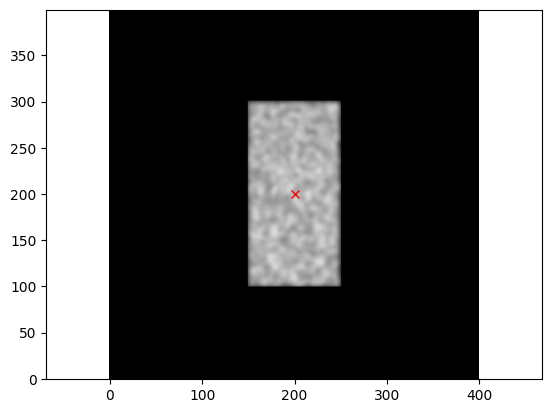

In [198]:
center = 200, 200
scene = generate_random_scene()
# scene = generate_gradient_scene()
# # scene = generate_all_white_scene()
plt.imshow(scene, origin="lower")

# Plot a cross in the center of the image
plt.plot(center[0], center[1], 'rx')
plt.axis('equal')
plt.show()

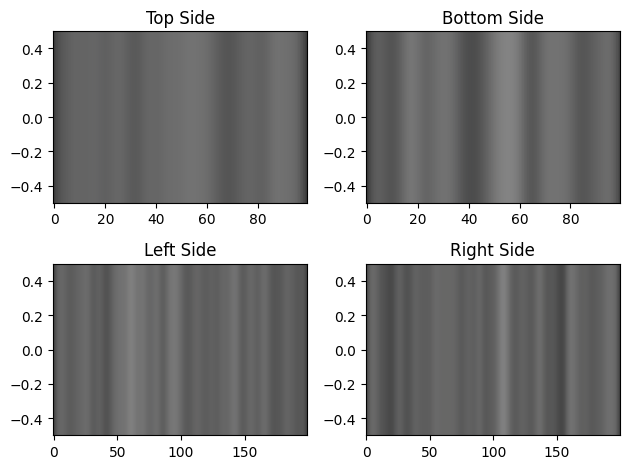

In [199]:
# Plot the 4 sides of the rectangle
top_side = scene[299, 150:250]
bottom_side = scene[100, 150:250]
left_side = scene[100:300, 150]
right_side = scene[100:300, 249]

plt.subplot(2, 2, 1)
plt.imshow(top_side.reshape(1, 100, 3), aspect="auto", origin="lower")
plt.title("Top Side")

plt.subplot(2, 2, 2)
plt.imshow(bottom_side.reshape(1, 100, 3), aspect="auto", origin="lower")
plt.title("Bottom Side")

plt.subplot(2, 2, 3)
plt.imshow(np.flip(left_side, axis=0).reshape(1, 200, 3), aspect="auto", origin="lower")
plt.title("Left Side")

plt.subplot(2, 2, 4)
plt.imshow(right_side.reshape(1, 200, 3), aspect="auto", origin="lower")
plt.title("Right Side")

plt.tight_layout()
plt.show()

In [200]:
def compute_tform_cam2world_2d(viewpoint, center):
    vx, vy = viewpoint
    cx, cy = center

    # Compute the forward vector (from viewpoint to center) and normalize it
    forward = np.array([cx - vx, cy - vy])
    forward = forward / np.linalg.norm(forward)

    # Compute the right vector (perpendicular to forward)
    right = np.array([forward[1], -forward[0]])

    # Rotation matrix from camera to world
    rotation_matrix = np.stack([right, forward], axis=1)

    # Translation vector (camera position in world coordinates)
    translation_vector = np.array([vx, vy])

    # Combine into a 3x3 transformation matrix
    tform_cam2world = np.eye(3)
    tform_cam2world[:2, :2] = rotation_matrix
    tform_cam2world[:2, 2] = translation_vector

    return tform_cam2world.astype("float32")


def take_1d_picture(scene, center, viewpoint, focal_length, picture_size, picture_fov, debug=False):
    # Center of the image
    cx, cy = center
    # Viewpoint coordinates
    vx, vy = viewpoint
    # Pixels of the picture
    projected_pixels = np.zeros((picture_size, 3), dtype=np.float32)
    # Define the image plane points and ray cast
    dx, dy = np.array([cx - vx, cy - vy])
    ux, uy = np.array([dx, dy]) / np.linalg.norm([dx, dy])
    perp_x, perp_y = uy, -ux
    t_values = np.linspace(-picture_fov/2, picture_fov/2, picture_size)
    image_plane_points_x = []
    image_plane_points_y = []

    if debug:
        plt.imshow(scene, origin= "lower")
        plt.plot(viewpoint[0], viewpoint[1], 'ro')
    for j,t in enumerate(t_values):
        x = vx + t * perp_x + focal_length * ux
        y = vy + t * perp_y + focal_length * uy
        image_plane_points_x.append(x)
        image_plane_points_y.append(y)
        # Ray cast
        for n in np.linspace(0, 400, 500):
            rx, ry = np.array([x - vx, y - vy])
            rx, ry = np.array([rx, ry]) / np.linalg.norm([rx, ry])
            # Find the intersection point
            intersect_x = int(vx + n * rx)
            intersect_y = int(vy + n * ry)
            if debug:
                plt.plot(intersect_x, intersect_y, 'wo')
            # Check if the ray is hitting the object
            if 0 <= intersect_y < scene.shape[0] and 0 <= intersect_x < scene.shape[1] and np.sum(scene[intersect_y, intersect_x]) != 0:
                projected_pixels[j] = scene[intersect_y, intersect_x]
                break
    # Compute the 3x3 transformation matrix from camera to world coordinates
    tform_cam2world = compute_tform_cam2world_2d(viewpoint, center)
    if debug:
        plt.plot(image_plane_points_x, image_plane_points_y, 'b-')
        plt.show()
    return projected_pixels, image_plane_points_x, image_plane_points_y, tform_cam2world

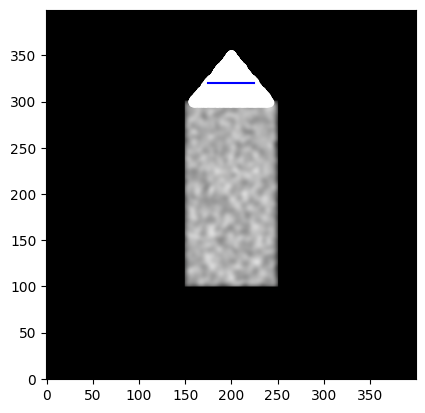

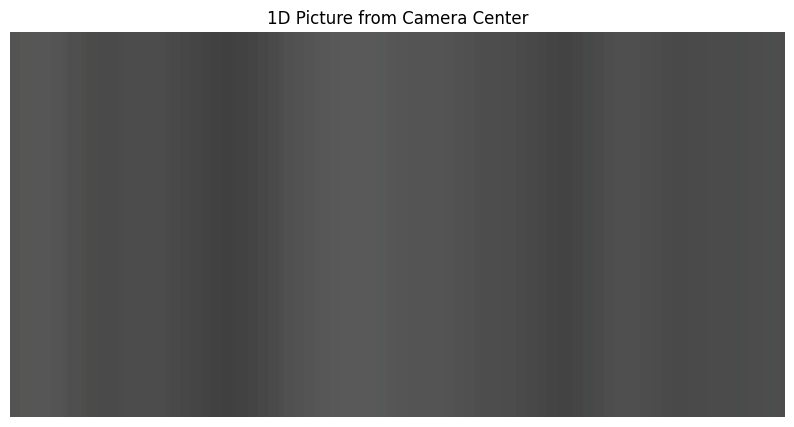

World coordinates of point 150: [125. 320.   1.]


In [201]:
# Define the camera parameters
focal_length = 30  # Example focal length
picture_fov = 50  # Size of the focal plane (in world units)
picture_size = 150  # Number of pixels in the 1D picture

# Take a 1D photo of the scene
viewpoint = (200, 350)  # Example camera center
picture, image_plane_points_x, image_plane_points_y, tform_cam2world = take_1d_picture(scene, center, viewpoint, focal_length, picture_size, picture_fov, debug=True)

# Visualize the 1D picture
plt.figure(figsize=(10, 5))
plt.imshow(picture.reshape(1, -1, 3), aspect='auto')
plt.axis('off')
plt.title('1D Picture from Camera Center')
plt.show()

# Print world coordinates of x_img
# Convert image point to camera coordinates
x_img = 150
camera_point = np.array([x_img -picture_size/2, focal_length, 1.0])
# Transform camera coordinates to world coordinates
world_point = tform_cam2world @ camera_point
print(f"World coordinates of point {x_img}: {world_point}")

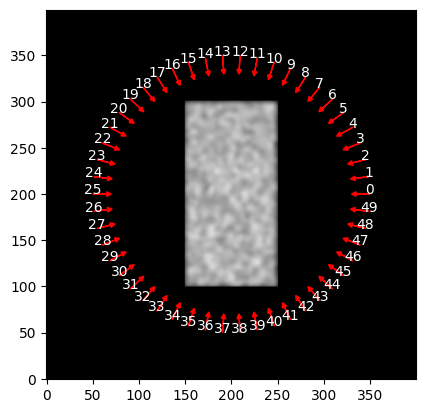

In [202]:
# Draw a circle around the rectangle and take pictures from each point
radius = 150
theta = np.linspace(0, 2 * np.pi - (2* np.pi / 50), 50)
viewpoints_x = 200 + radius * np.cos(theta)
viewpoints_y = 200 + radius * np.sin(theta)
images = []
tform_cam2worlds = []
center = (200, 200)

plt.imshow(scene, origin="lower")

arrow_number = 0
for v_x, v_y in zip(viewpoints_x, viewpoints_y):
    image, _, _, tform_cam2world = take_1d_picture(scene, center, (v_x, v_y), focal_length, picture_size, picture_fov)
    images.append(image)
    tform_cam2worlds.append(tform_cam2world)
    # Plot the arrows with the arrow number near to the arrow
    plt.arrow(v_x, v_y, (200 - v_x) / 10, (200 - v_y) / 10, head_width=5, head_length=5, fc='red', ec='red')
    plt.annotate(str(arrow_number), (v_x, v_y), textcoords="offset points", xytext=(0, 0), ha='center', color="white")
    arrow_number += 1

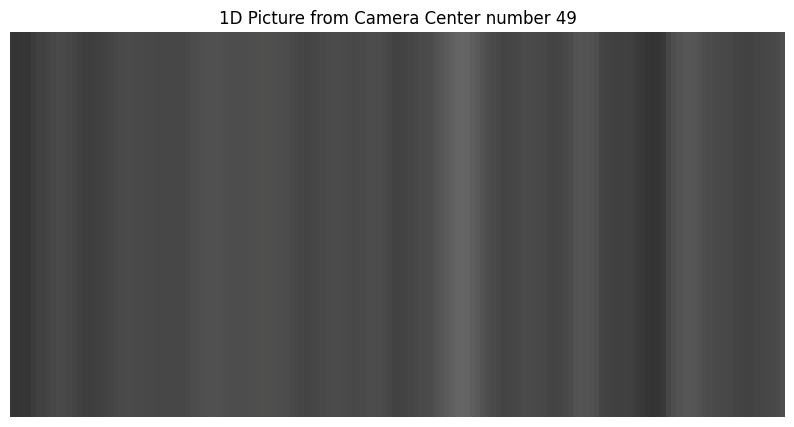

In [203]:
i = 49

# Visualize the 1D picture
plt.figure(figsize=(10, 5))
plt.imshow(images[i].reshape(1, -1, 3), aspect='auto')
plt.axis('off')
plt.title(f'1D Picture from Camera Center number {i}')
plt.show()

In [204]:
def get_ray_bundle_2d(picture_size: int, picture_fov: int, focal_length: float, tform_cam2world: np.ndarray):
    # Generate pixel coordinates for the 1D picture
    t_values = torch.linspace(-picture_fov / 2, picture_fov / 2, picture_size)

    # Normalize pixel coordinates
    directions = torch.stack([t_values / focal_length, torch.ones_like(t_values)], dim=-1)

    # Rotate and translate to world coordinates
    rotation_matrix = tform_cam2world[:2, :2]
    translation_vector = tform_cam2world[:2, 2]

    ray_directions = torch.matmul(directions, rotation_matrix.T)
    ray_origins = torch.tile(translation_vector, (picture_size, 1))

    return ray_origins, ray_directions

In [205]:
def compute_query_points_from_rays_2d(
    ray_origins: torch.Tensor,
    ray_directions: torch.Tensor,
    near_thresh: float,
    far_thresh: float,
    num_samples: int,
    randomize: Optional[bool] = True
) -> Tuple[torch.Tensor, torch.Tensor]:
    r"""Compute query 2D points given the "bundle" of rays. The near_thresh and far_thresh
    variables indicate the bounds within which 2D points are to be sampled.

    Args:
      ray_origins (torch.Tensor): Origin of each ray in the "bundle" as returned by the
        `get_ray_bundle()` method (shape: :math:`(picture_size, 2)`).
      ray_directions (torch.Tensor): Direction of each ray in the "bundle" as returned by the
        `get_ray_bundle()` method (shape: :math:`(picture_size, 2)`).
      near_thresh (float): The 'near' extent of the bounding volume (i.e., the nearest depth
        coordinate that is of interest/relevance).
      far_thresh (float): The 'far' extent of the bounding volume (i.e., the farthest depth
        coordinate that is of interest/relevance).
      num_samples (int): Number of samples to be drawn along each ray. Samples are drawn
        randomly, whilst trying to ensure "some form of" uniform spacing among them.
      randomize (optional, bool): Whether or not to randomize the sampling of query points.
        By default, this is set to `True`. If disabled (by setting to `False`), we sample
        uniformly spaced points along each ray in the "bundle".

    Returns:
      query_points (torch.Tensor): Query points along each ray
        (shape: :math:`(picture_size, num_samples, 2)`).
      depth_values (torch.Tensor): Sampled depth values along each ray
        (shape: :math:`(num_samples)`).
    """
    # Shape: (num_samples)
    depth_values = torch.linspace(near_thresh, far_thresh, num_samples).to(ray_origins)
    if randomize is True:
        # ray_origins: (picture_size, 2)
        # noise_shape = (picture_size, num_samples)
        noise_shape = list(ray_origins.shape[:-1]) + [num_samples]
        # depth_values: (num_samples)
        depth_values = depth_values + torch.rand(noise_shape).to(ray_origins) * (far_thresh - near_thresh) / num_samples

    # (picture_size, num_samples, 2) = (picture_size, 1, 2) + (picture_size, 1, 2) * (num_samples, 1)
    # query_points: (picture_size, num_samples, 2)
    query_points = ray_origins[..., None, :] + ray_directions[..., None, :] * depth_values[..., :, None]
    return query_points, depth_values

In [206]:
def render_volume_density_2d(
    radiance_field: torch.Tensor,
    ray_origins: torch.Tensor,
    depth_values: torch.Tensor,
    no_activation = False,
) -> Tuple[torch.Tensor, torch.Tensor, torch.Tensor]:
    r"""Differentiably renders a radiance field, given the origin of each ray in the
    "bundle", and the sampled depth values along them.

    Args:
        radiance_field (torch.Tensor): A "field" where, at each query location (X, Y),
          we have an emitted (RGB) color and a volume density (denoted :math:`\sigma` in
          the paper) (shape: :math:`(picture_size, num_samples, 4)`).
        ray_origins (torch.Tensor): Origin of each ray in the "bundle" as returned by the
          `get_ray_bundle()` method (shape: :math:`(picture_size, 2)`).
        depth_values (torch.Tensor): Sampled depth values along each ray
          (shape: :math:`(num_samples)`).

    Returns:
        rgb_map (torch.Tensor): Rendered RGB image (shape: :math:`(picture_size, 3)`).
        depth_map (torch.Tensor): Rendered depth image (shape: :math:`(picture_size)`).
        acc_map (torch.Tensor): Accumulated transmittance map (shape: :math:`(picture_size)`).
    """
    # Compute alpha values
    sigma_a = torch.nn.functional.relu(radiance_field[..., 3])
    rgb = torch.sigmoid(radiance_field[..., :3])
    if no_activation:
        rgb = radiance_field[..., :3]
        sigma_a = radiance_field[..., 3]
    # Large constant for the distance at the last sample point
    one_e_10 = torch.tensor([1e10], dtype=ray_origins.dtype, device=ray_origins.device)
    # Compute distances between adjacent depth values
    dists = torch.cat((depth_values[..., 1:] - depth_values[..., :-1], one_e_10.expand(depth_values[..., :1].shape)), dim=-1)
    # Compute alpha values
    alpha = 1. - torch.exp(-sigma_a * dists)
    # Compute weights
    weights = alpha * cumprod_exclusive(1. - alpha + 1e-10)
    # Compute rendered RGB map
    rgb_map = (weights[..., None] * rgb).sum(dim=-2)
    # Compute rendered depth map
    depth_map = (weights * depth_values).sum(dim=-1)
    # Compute accumulated transmittance map
    acc_map = weights.sum(-1)
    return rgb_map, depth_map, acc_map


def cumprod_exclusive(tensor):
    r"""
    Compute exclusive cumulative product of the input tensor along the last dimension.
    """
    # Compute the cumulative product along the last dimension and prepend 1 along the last dimension
    cumprod = torch.cumprod(tensor, dim=-1)
    cumprod = torch.cat([torch.ones_like(cumprod[..., :1]), cumprod[..., :-1]], dim=-1)
    return cumprod

In [207]:
def positional_encoding(
    tensor, num_encoding_functions=6, include_input=True, log_sampling=True
) -> torch.Tensor:
  r"""Apply positional encoding to the input.

  Args:
    tensor (torch.Tensor): Input tensor to be positionally encoded.
    num_encoding_functions (optional, int): Number of encoding functions used to
        compute a positional encoding (default: 6).
    include_input (optional, bool): Whaether or not to include the input in the
        computed positional encoding (default: True).
    log_sampling (optional, bool): Sample logarithmically in frequency space, as
        opposed to linearly (default: True).

  Returns:
    (torch.Tensor): Positional encoding of the input tensor.
  """
  # Trivially, the input tensor is added to the positional encoding.
  encoding = [tensor] if include_input else []
  # Now, encode the input using a set of high-frequency functions and append the
  # resulting values to the encoding.
  frequency_bands = None
  if log_sampling:
      frequency_bands = 2.0 ** torch.linspace(
            0.0,
            num_encoding_functions - 1,
            num_encoding_functions,
            dtype=tensor.dtype,
            device=tensor.device,
        )
  else:
      frequency_bands = torch.linspace(
          2.0 ** 0.0,
          2.0 ** (num_encoding_functions - 1),
          num_encoding_functions,
          dtype=tensor.dtype,
          device=tensor.device,
      )

  for freq in frequency_bands:
      for func in [torch.sin, torch.cos]:
          encoding.append(func(tensor * freq))
  # Special case, for no positional encoding
  if len(encoding) == 1:
      return encoding[0]
  else:
      return torch.cat(encoding, dim=-1)

In [208]:
class VeryTinyNerfModel2D(torch.nn.Module):
    r"""Define a "very tiny" NeRF model comprising three fully connected layers for 2D inputs.
    """
    def __init__(self, filter_size=128, num_encoding_functions=6):
        super(VeryTinyNerfModel2D, self).__init__()
        # Input layer: input dimension is 2 for 2D coordinates
        self.layer1 = torch.nn.Linear(2 + 2 * 2 * num_encoding_functions, filter_size)
        # Layer 2
        self.layer2 = torch.nn.Linear(filter_size, filter_size)
        # Layer 3: output 4 dimensions (RGB + density)
        self.layer3 = torch.nn.Linear(filter_size, 4)
        # Activation function
        self.relu = torch.nn.functional.relu

    def forward(self, x):
        x = self.relu(self.layer1(x))
        x = self.relu(self.layer2(x))
        x = self.layer3(x)
        return x

In [209]:
def run_one_iter_of_tinynerf_2d(world_size, img_size, picture_fov, focal_length, tform_cam2world,
                                near_thresh, far_thresh, depth_samples_per_ray,
                                get_minibatches_function, model, chunksize=1024, debug_rendering=False):
    # Get the "bundle" of rays through all image pixels.
    ray_origins, ray_directions = get_ray_bundle_2d(img_size, picture_fov, focal_length, tform_cam2world)

    # Sample query points along each ray
    query_points, depth_values = compute_query_points_from_rays_2d(
        ray_origins, ray_directions, near_thresh, far_thresh, depth_samples_per_ray
    )

    # "Flatten" the query points.
    flattened_query_points = query_points.reshape((-1, 2))

    # Normalize the query points to the range [-1, 1]
    flattened_query_points = (flattened_query_points / world_size) * 2.0 - 1.0

    # Encode the query points
    encoded_query_points = positional_encoding(flattened_query_points)

    # Split the query points into "chunks", run the model on all chunks, and concatenate the results
    batches = get_minibatches_function(encoded_query_points, chunksize=chunksize)
    predictions = []
    for batch in batches:
        predictions.append(model(batch))
    radiance_field_flattened = torch.cat(predictions, dim=0)

    # "Unflatten" to obtain the radiance field.
    unflattened_shape = list(query_points.shape[:-1]) + [4]
    radiance_field = torch.reshape(radiance_field_flattened, unflattened_shape)

    # Debug rendering is used only to debug the rendering part, because the radiance field
    # is always perfect based on the original 2D scene. When there's an object density =1 and RGB=scene RGB
    if debug_rendering:
        for i in range(query_points.shape[0]):
            for j in range(query_points.shape[1]):
                x,y = int(query_points[i, j, 0]), int(query_points[i, j, 1])
                if np.sum(scene[y, x]) != 0:
                    radiance_field[i,j,:3] = torch.tensor(scene[y, x])
                    radiance_field[i,j,3] = 1
                else:
                    radiance_field[i,j,:3] = torch.tensor([0, 0, 0])
                    radiance_field[i,j,3] = 0

    # Perform differentiable volume rendering to re-synthesize the RGB image.
    rgb_predicted, _, _ = render_volume_density_2d(radiance_field, ray_origins, depth_values)

    return rgb_predicted

In [210]:
def get_minibatches(inputs: torch.Tensor, chunksize: Optional[int] = 1024 * 8):
  r"""Takes a huge tensor (ray "bundle") and splits it into a list of minibatches.
  Each element of the list (except possibly the last) has dimension `0` of length
  `chunksize`.
  """
  return [inputs[i:i + chunksize] for i in range(0, inputs.shape[0], chunksize)]

In [211]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

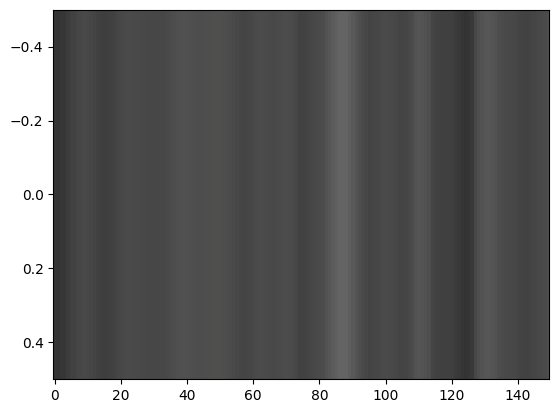

In [212]:
# Backup images for debug
debug_images = images.copy()
debug_tfrom_cam2world = tform_cam2world.copy()

# Images and matrices to numpy
images = np.array(images)
tform_cam2worlds = np.array(tform_cam2worlds)

# Hold one image for test
testimg, testpose = images[49], tform_cam2worlds[49]

# Send everything to device
testimg = torch.from_numpy(testimg).to(device)
testpose = torch.from_numpy(testpose).to(device)
images = torch.from_numpy(images[:49]).to(device)
tform_cam2worlds = torch.from_numpy(tform_cam2worlds[:49]).to(device)
focal_length = torch.from_numpy(np.array(focal_length)).to(device)

# Plot test holdout image
plt.imshow(testimg.detach().cpu().numpy().reshape(1, -1, 3), aspect="auto")
plt.show()

Loss: 0.04047830402851105


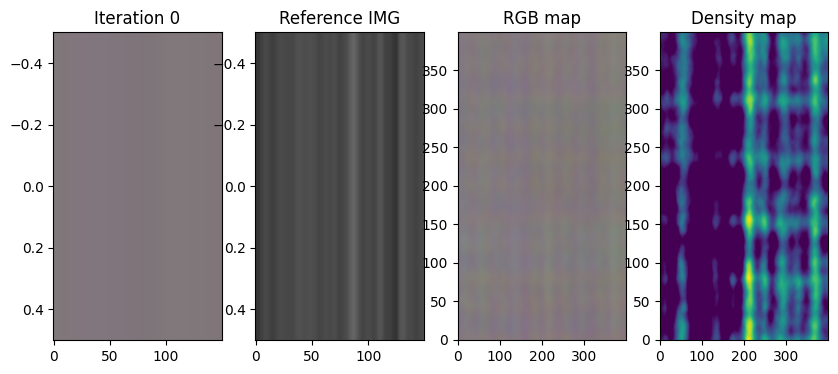

Loss: 0.0018369987374171615


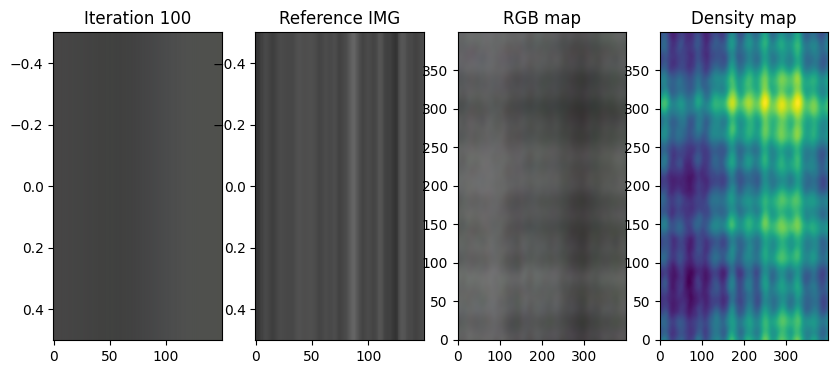

Loss: 0.004644241649657488


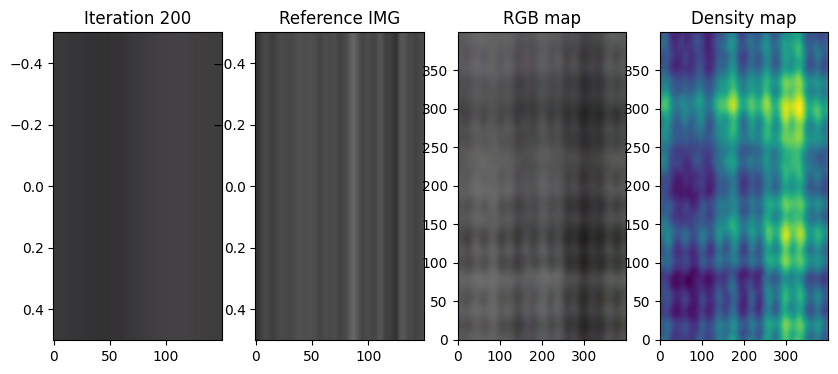

Loss: 0.0021691578440368176


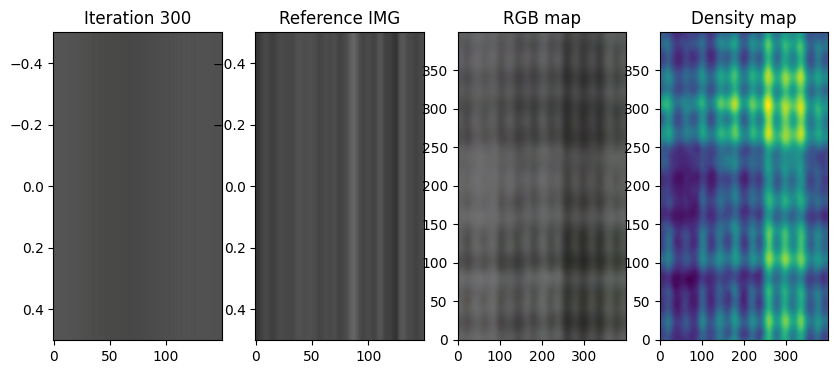

Loss: 0.0016870514955371618


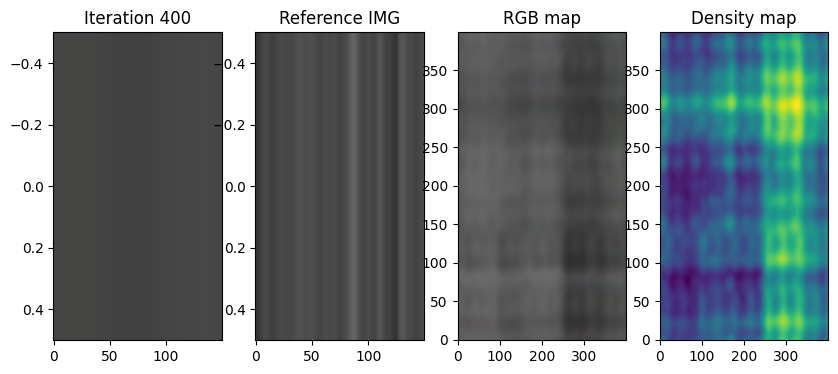

Loss: 0.0014188663335517049


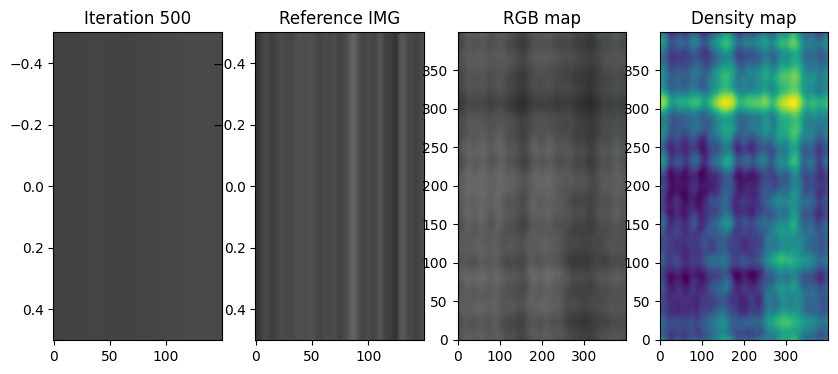

Loss: 0.0015394705114886165


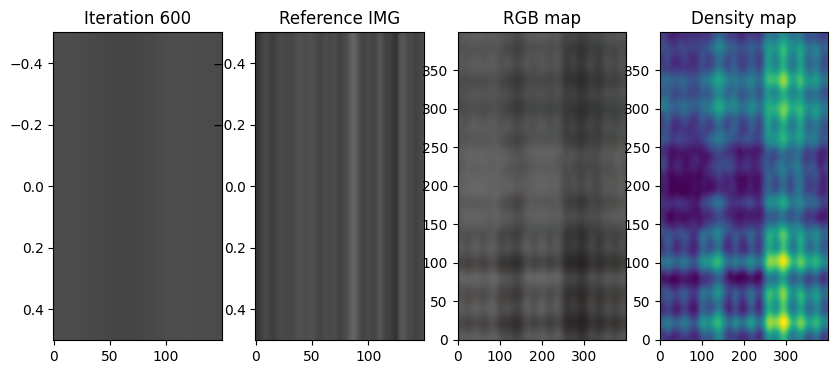

Loss: 0.0012487518833950162


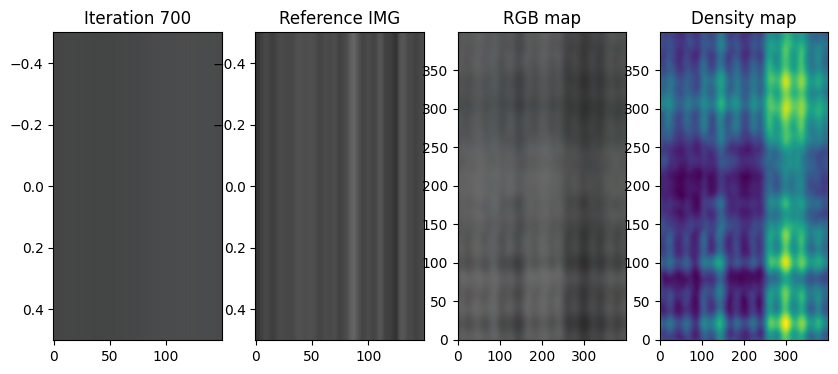

Loss: 0.0012093371478840709


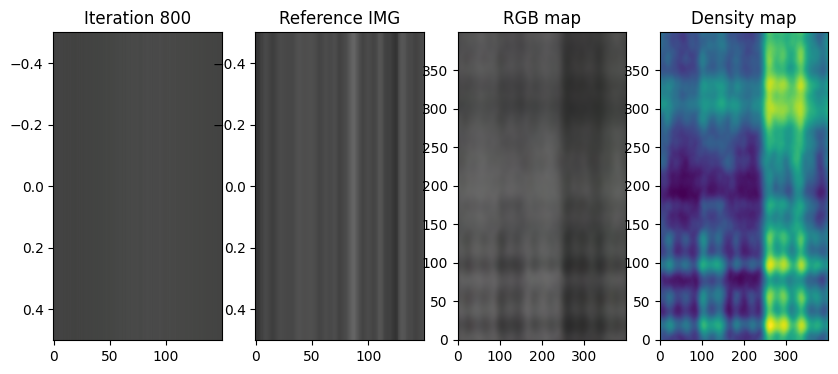

Loss: 0.0012083676410838962


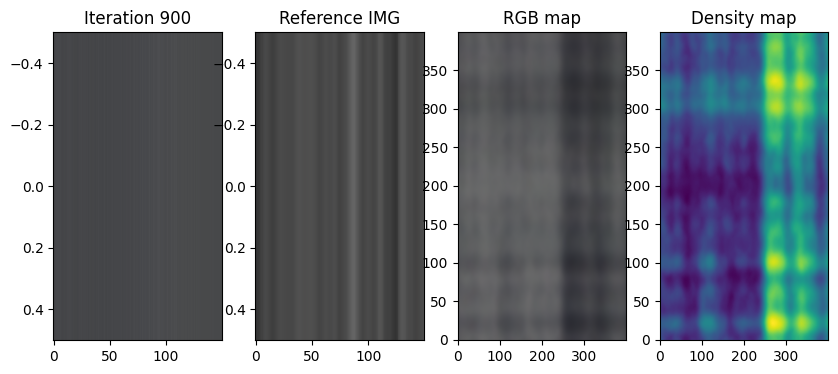

Loss: 0.002068032743409276


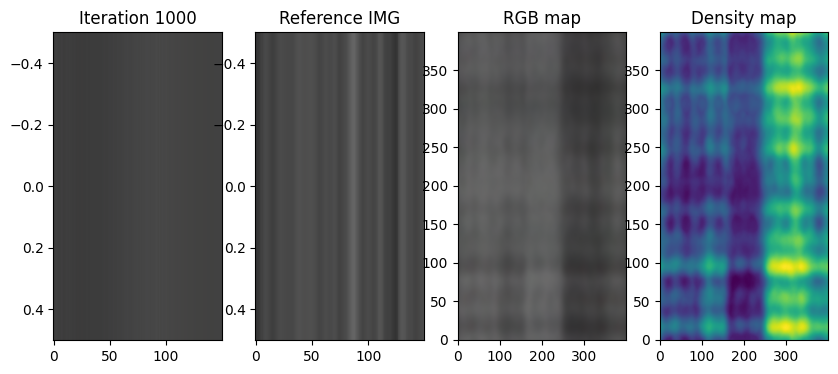

Loss: 0.0011609819484874606


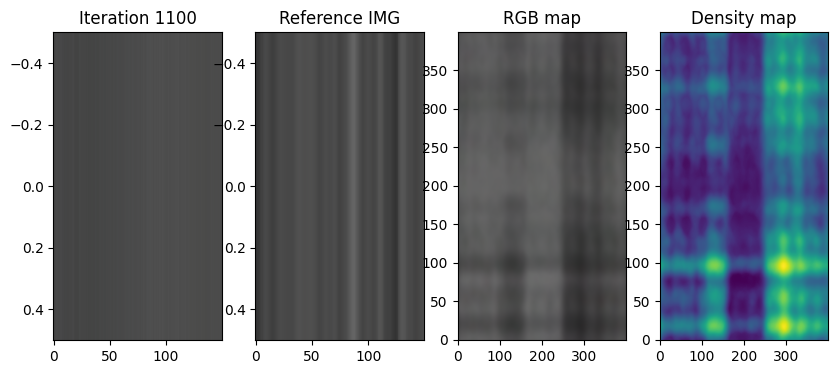

Loss: 0.0021294523030519485


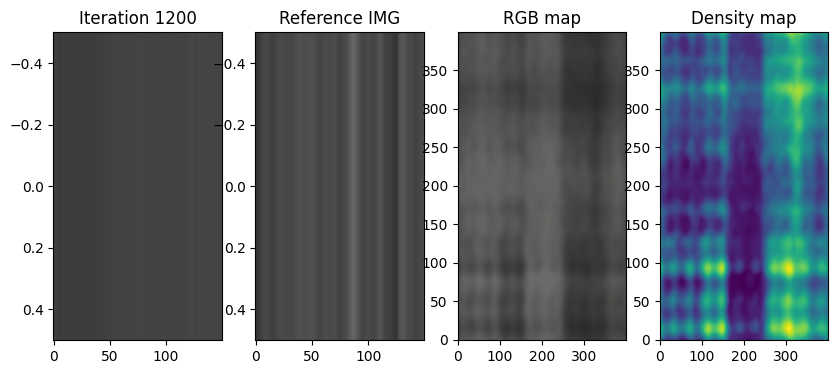

Loss: 0.0013058057520538568


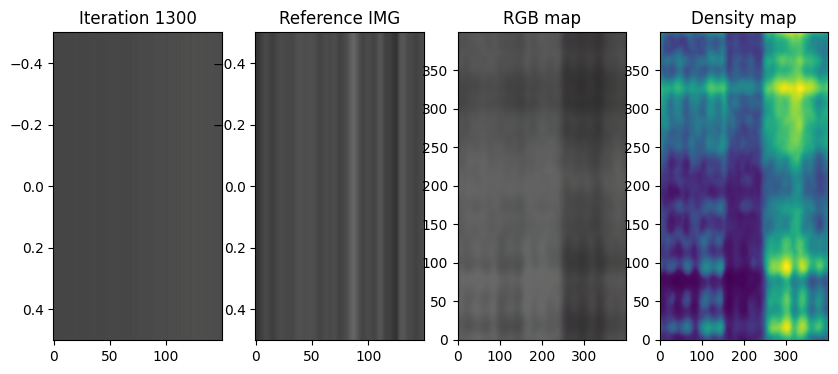

Loss: 0.001377801992930472


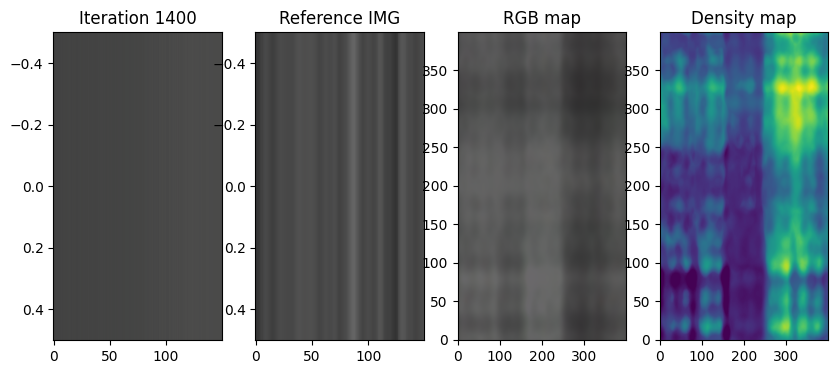

Loss: 0.0011647467035800219


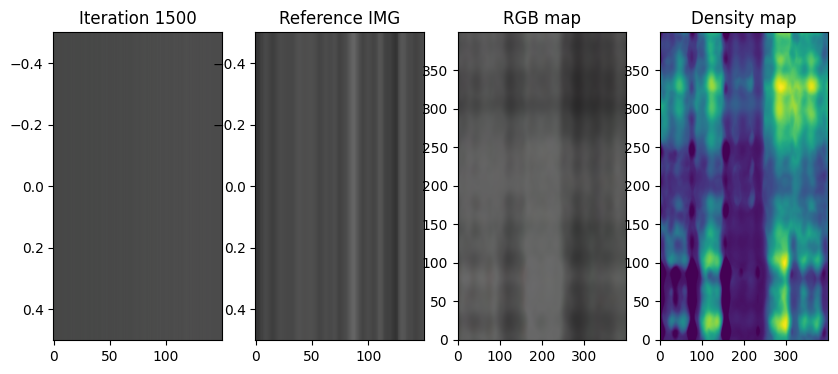

Loss: 0.0011832830496132374


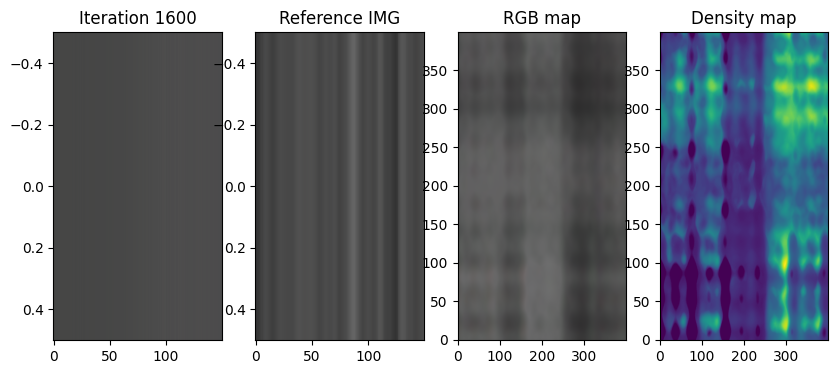

Loss: 0.001658432767726481


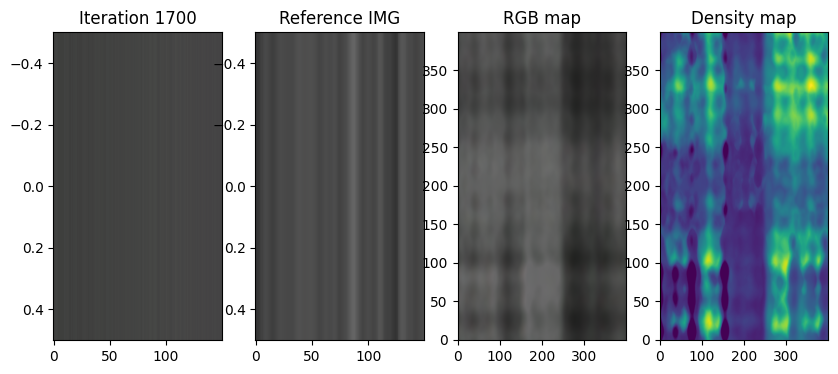

Loss: 0.0030974086839705706


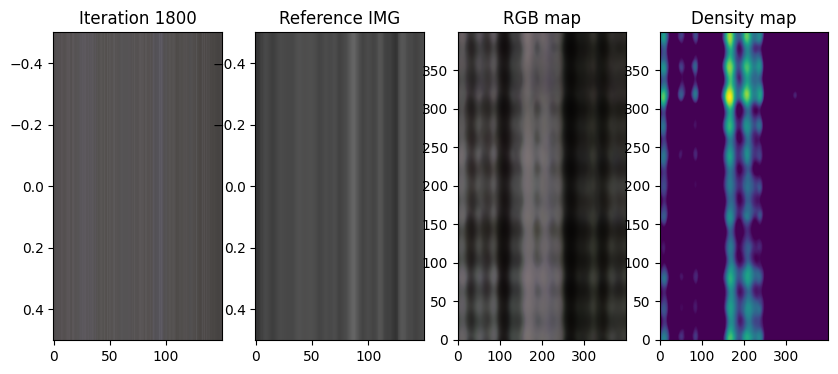

Loss: 0.001722368411719799


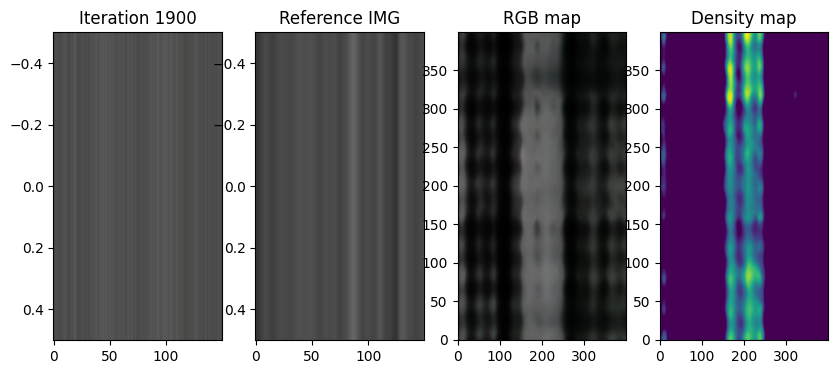

Loss: 0.0017031218158081174


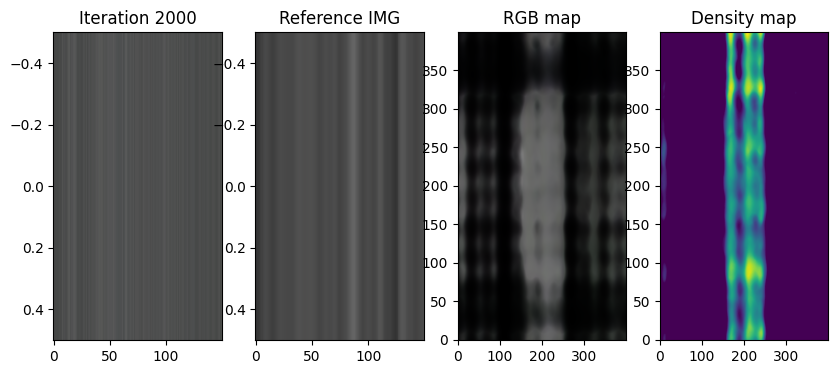

Loss: 0.0008399985963478684


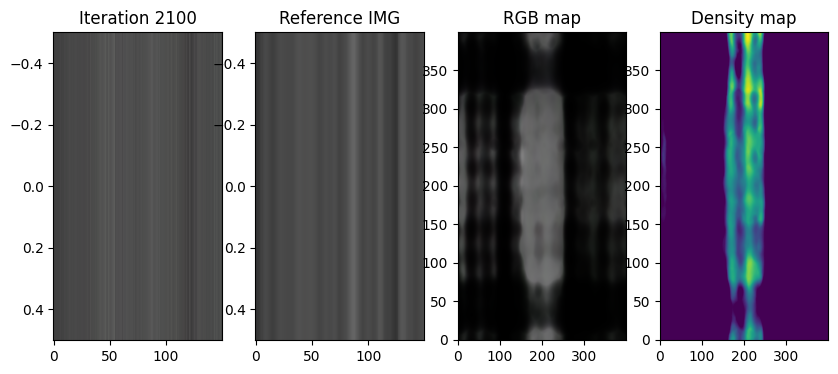

Loss: 0.0006253414903767407


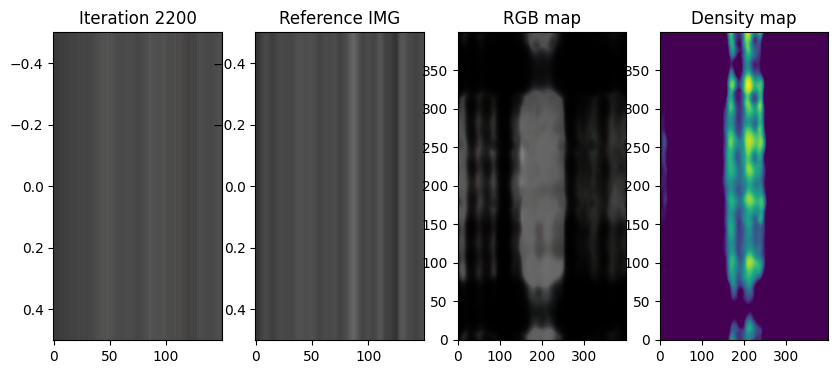

Loss: 0.0005808793939650059


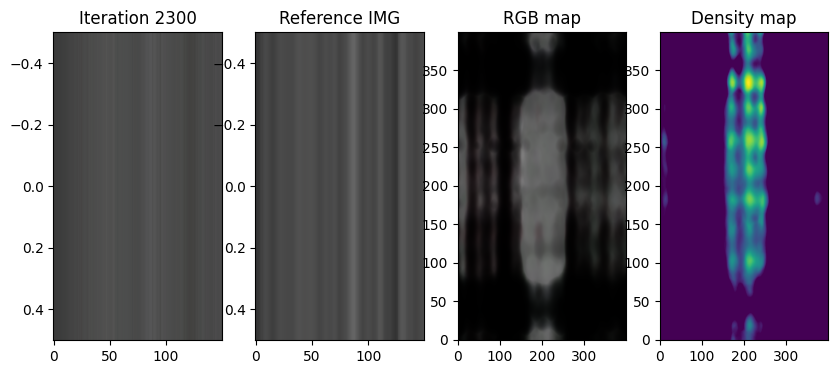

Loss: 0.00048630754463374615


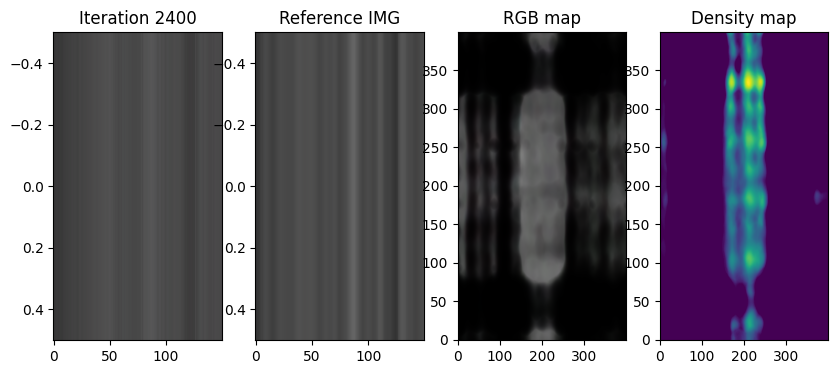

Loss: 0.00036268148687668145


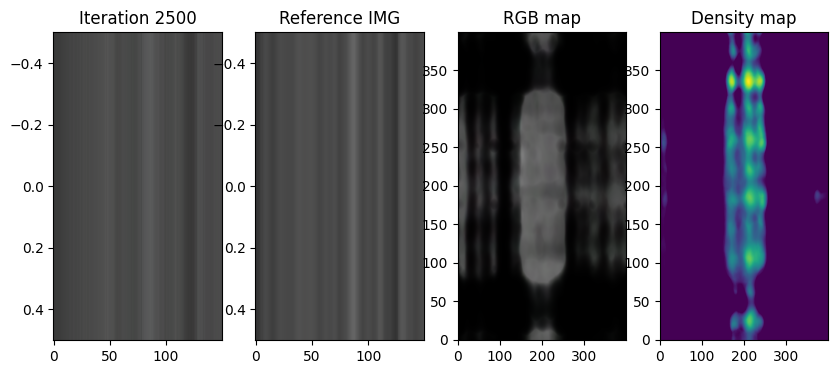

Loss: 0.000330040929839015


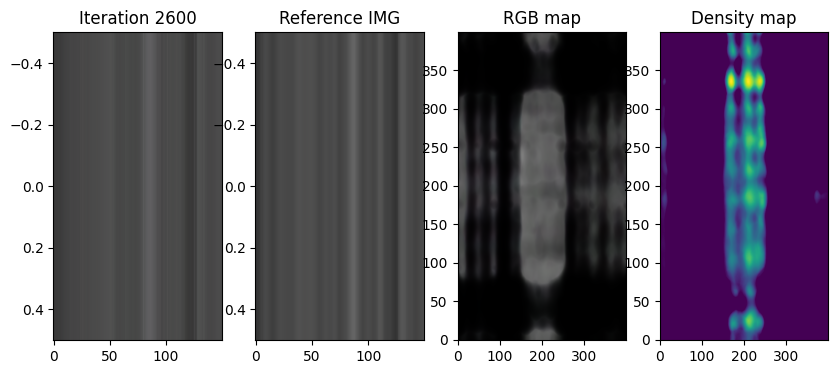

Loss: 0.00027608132222667336


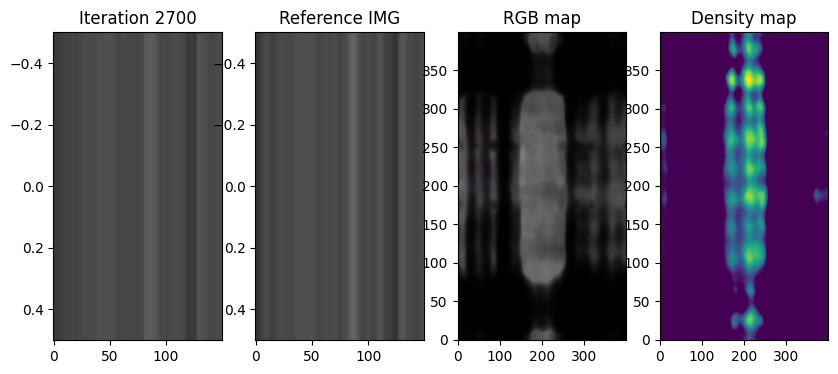

Loss: 0.00045139616122469306


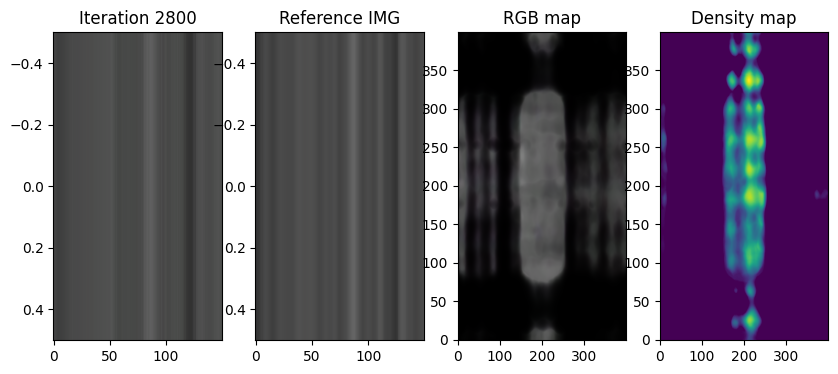

Loss: 0.0002803986717481166


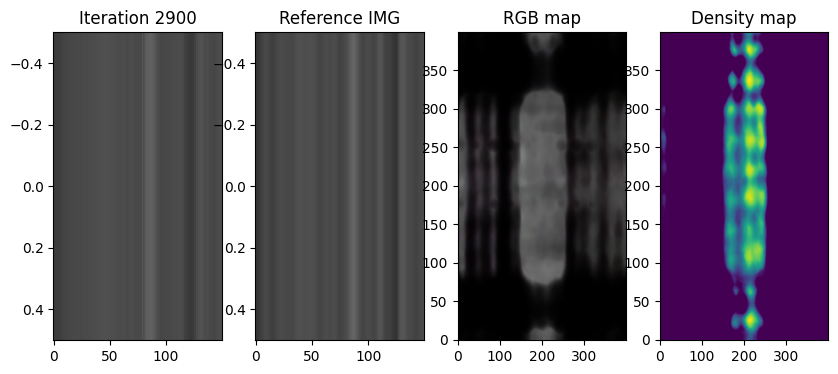

Loss: 0.000273635407211259


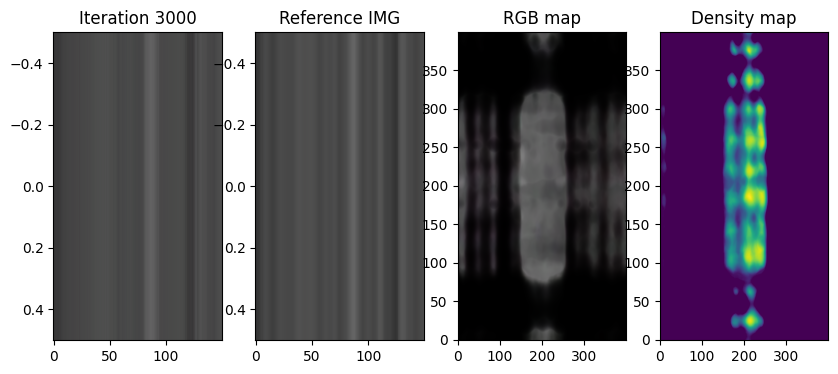

Loss: 0.0004077009216416627


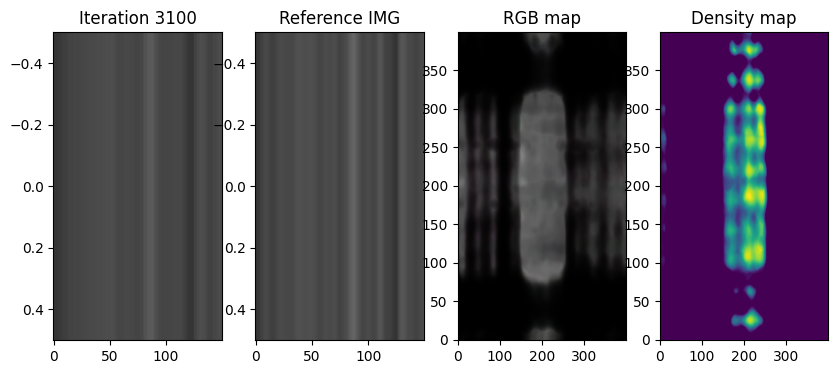

Loss: 0.00024285595281980932


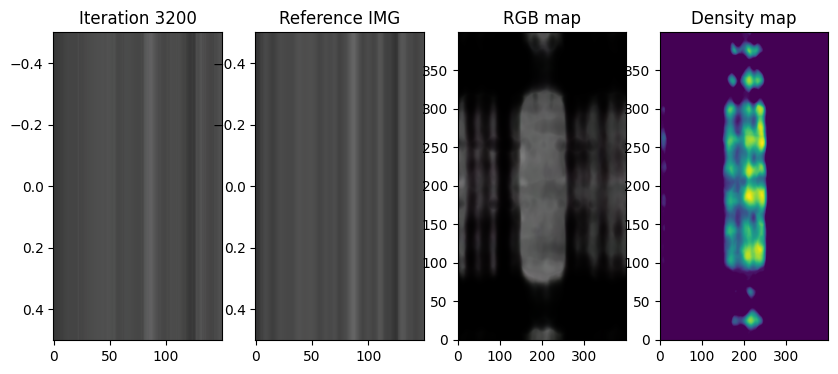

Loss: 0.00025792288943193853


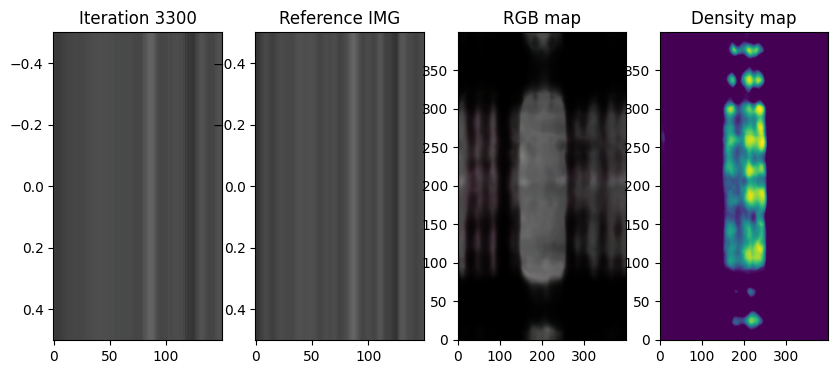

Loss: 0.00029601051937788725


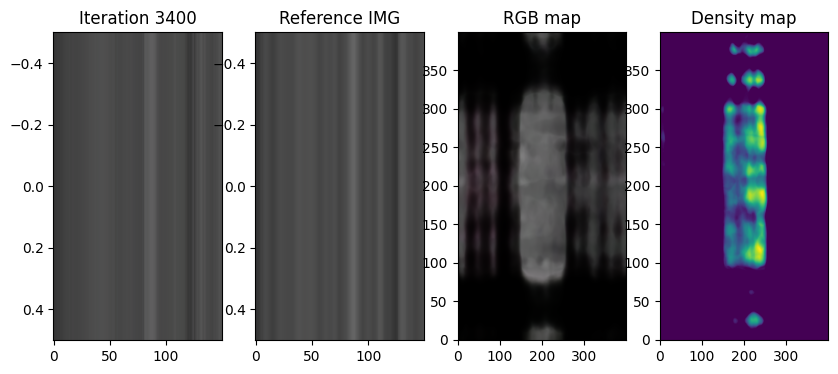

Loss: 0.00020680893794633448


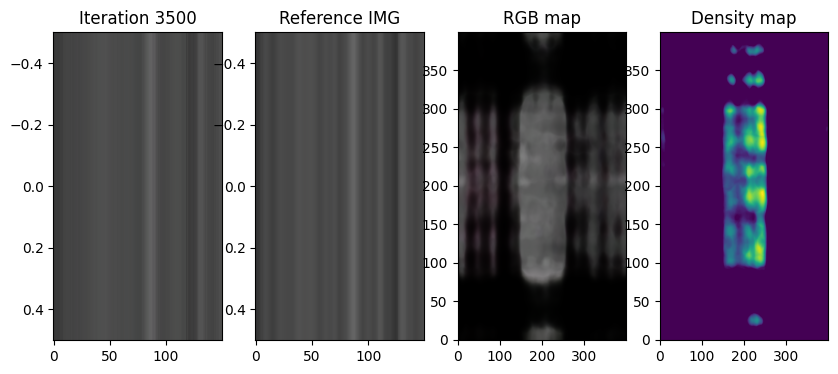

Loss: 0.0003259636287111789


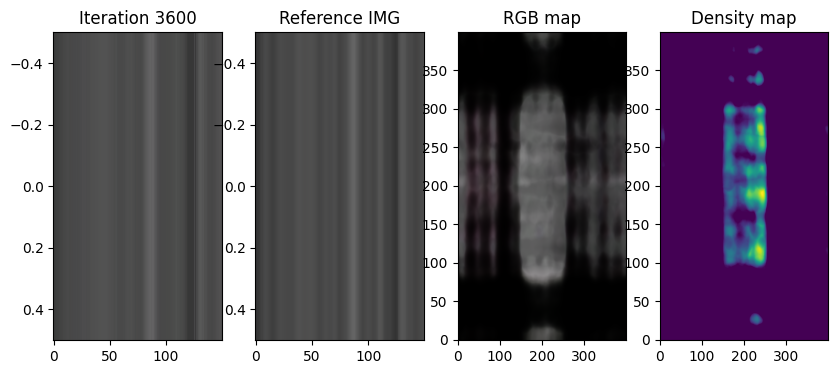

Loss: 0.0002816092746797949


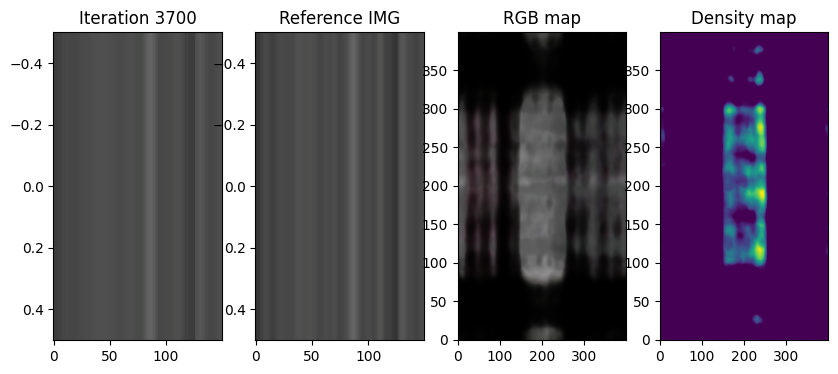

Loss: 0.00044939247891306877


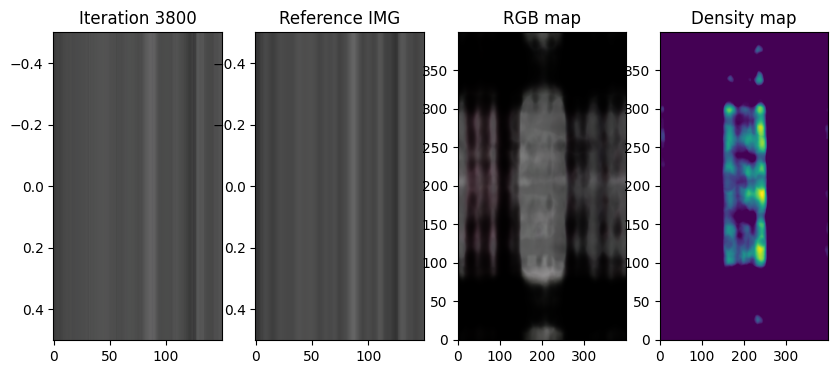

Loss: 0.00022744876332581043


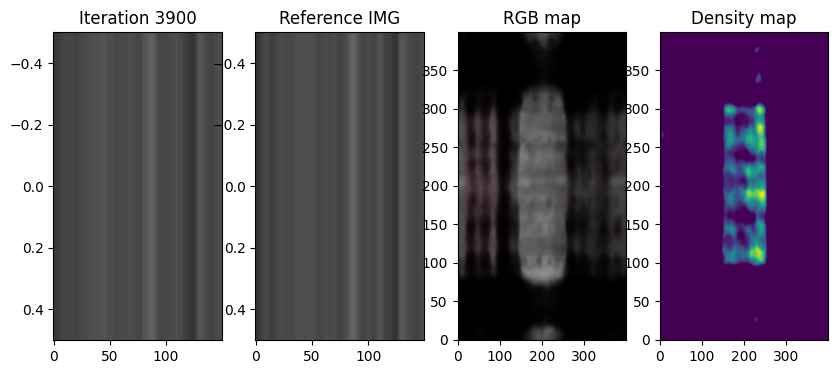

Loss: 0.00021979179291520268


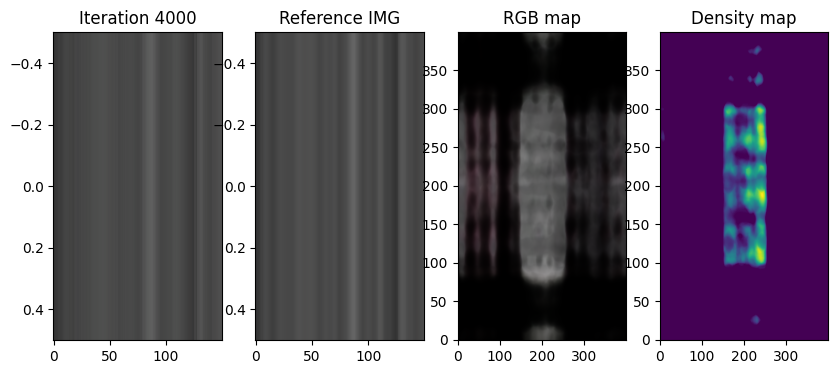

Loss: 0.00018982858455274254


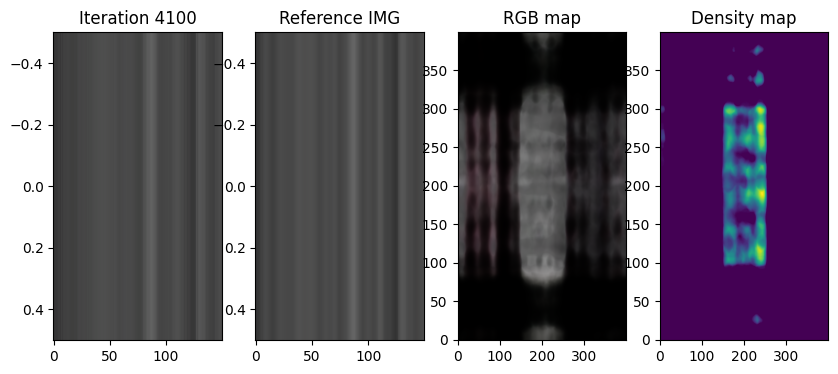

Loss: 0.0003037320275325328


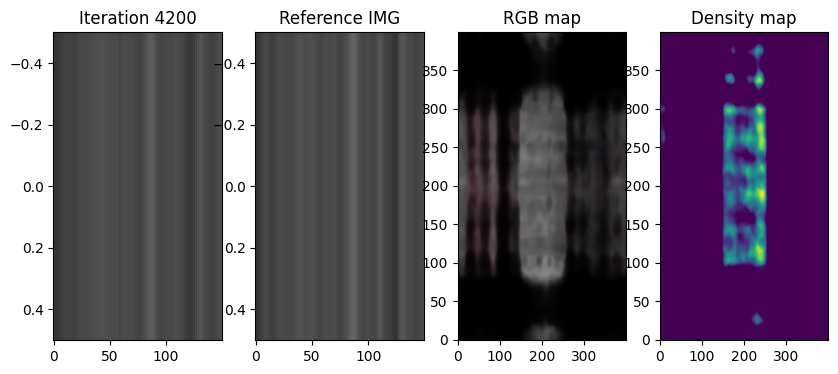

Loss: 0.00018574985733721405


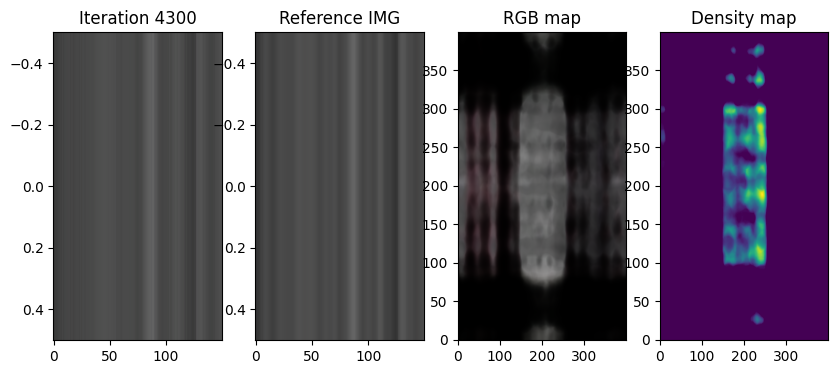

Loss: 0.0002512355276849121


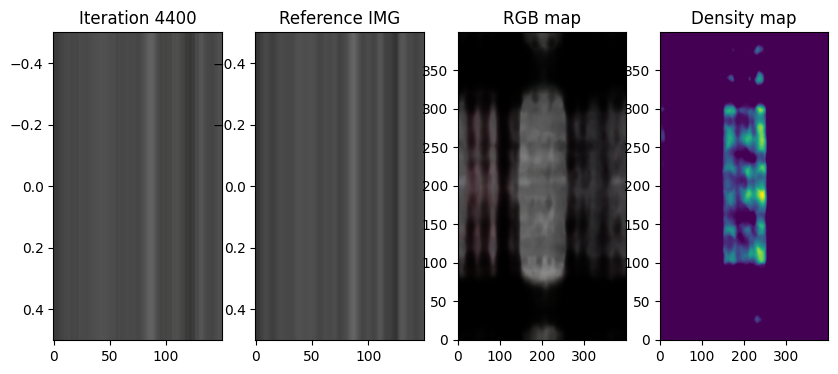

Loss: 0.0002126549370586872


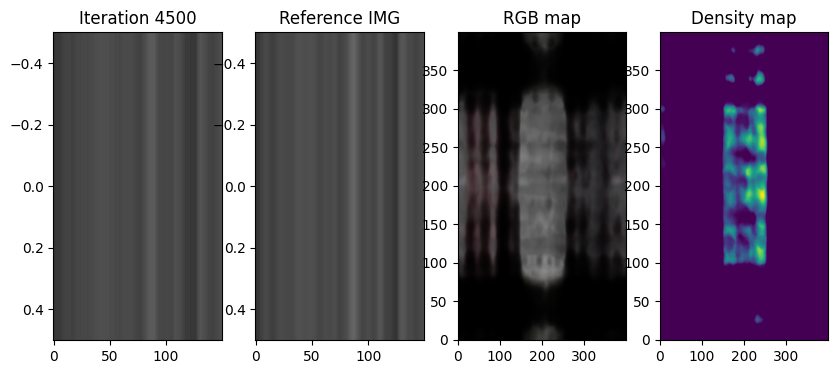

Loss: 0.00019273206999059767


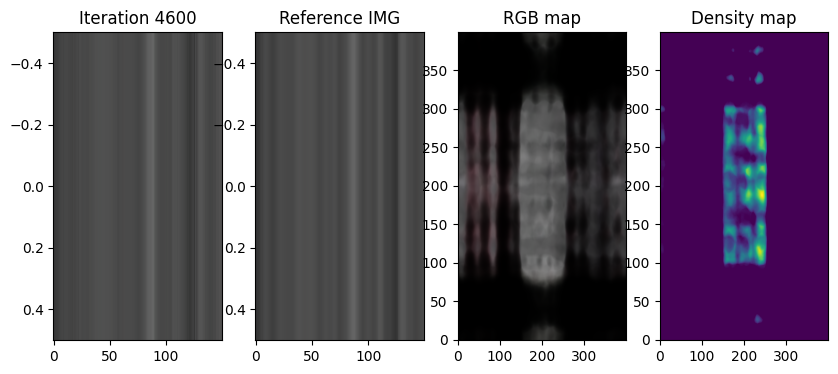

Loss: 0.00011704703501891345


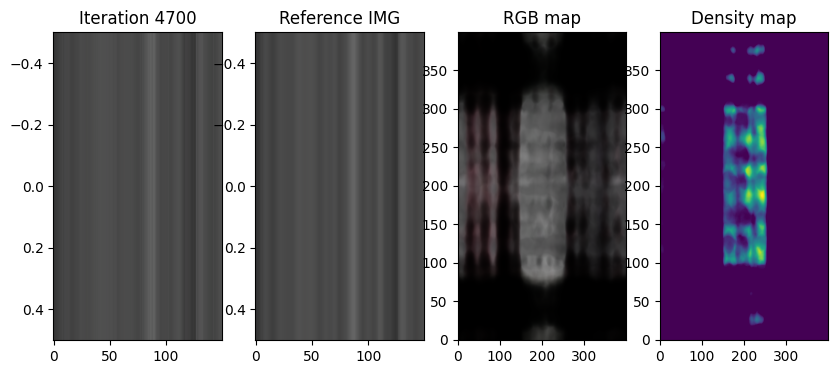

Loss: 0.0001668361946940422


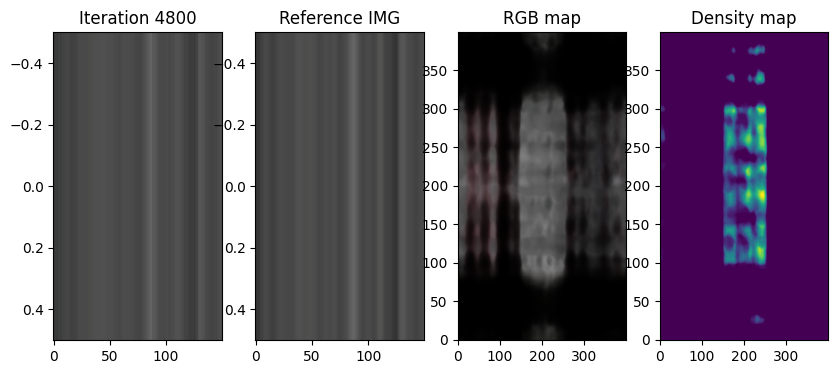

Loss: 0.00017926532018464059


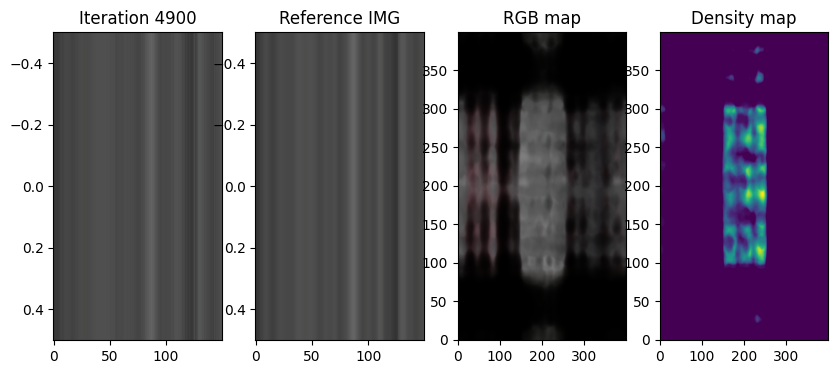

Loss: 0.00012263702228665352


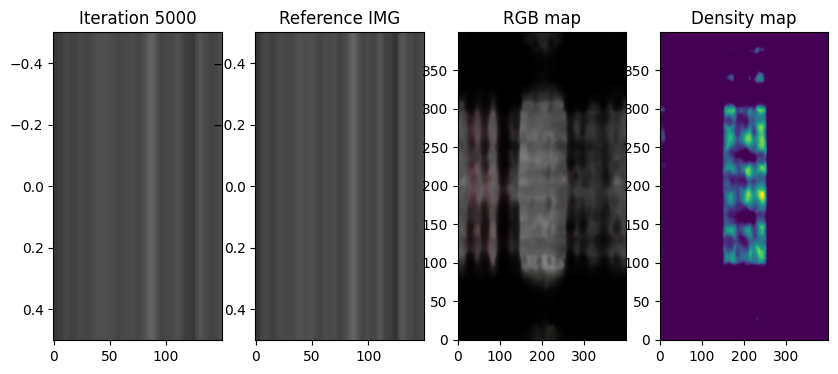

Loss: 0.0005479146493598819


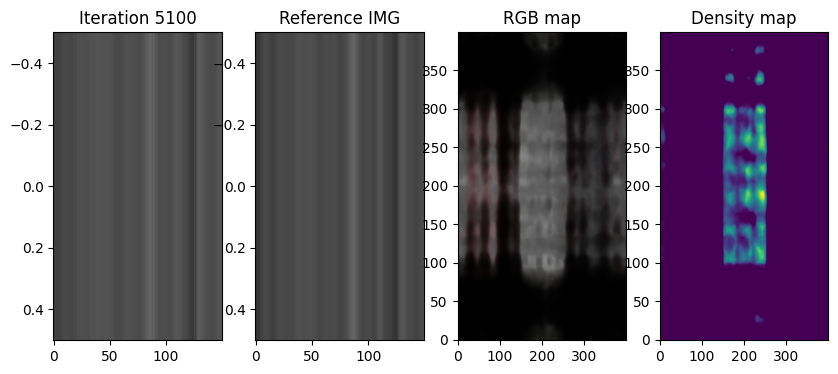

Loss: 0.00018535030540078878


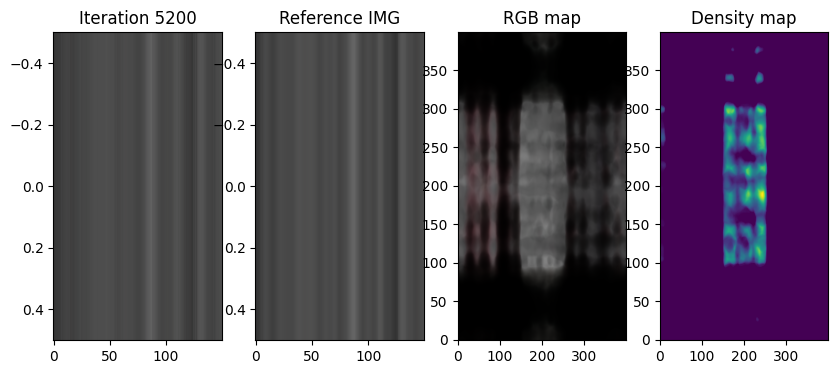

Loss: 0.00021370436297729611


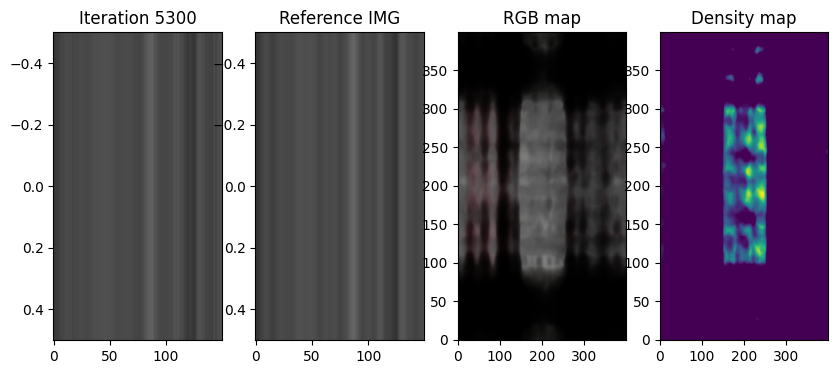

Loss: 0.0001294764078920707


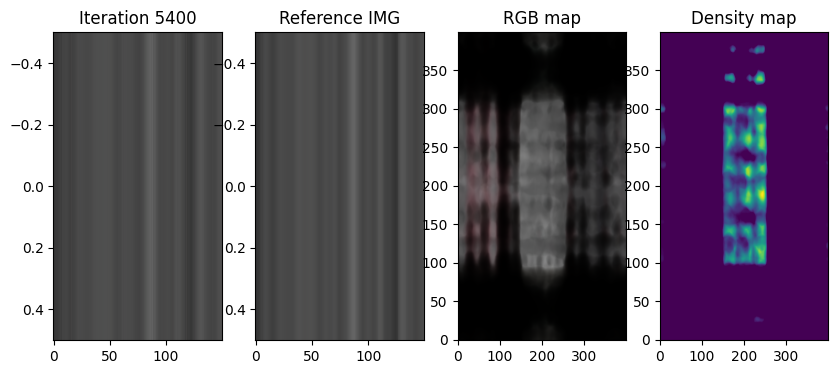

Loss: 0.00015606579836457968


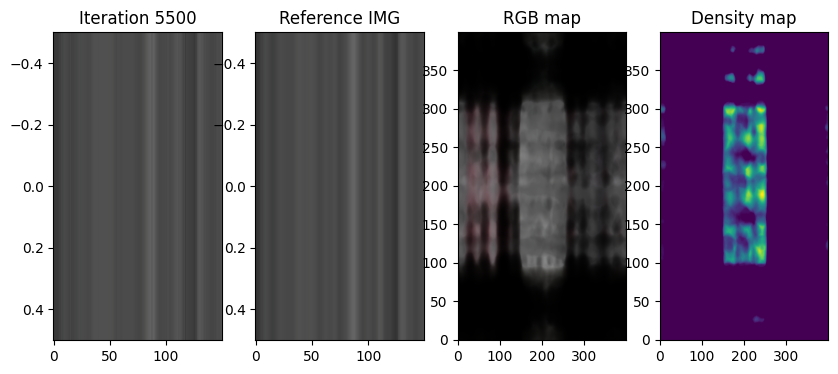

Loss: 0.0003678385401144624


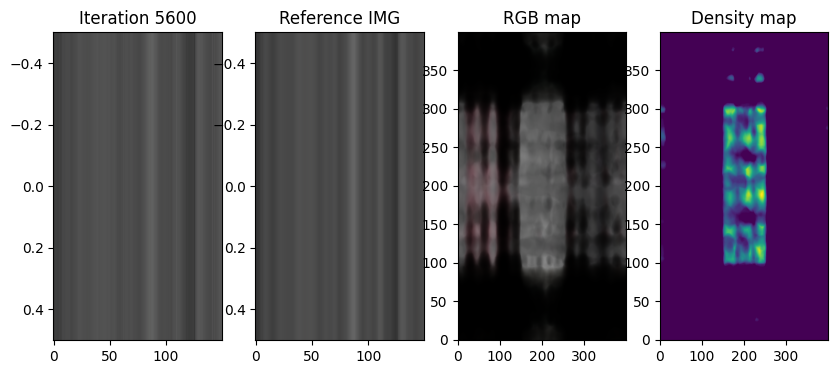

Loss: 0.00019752932712435722


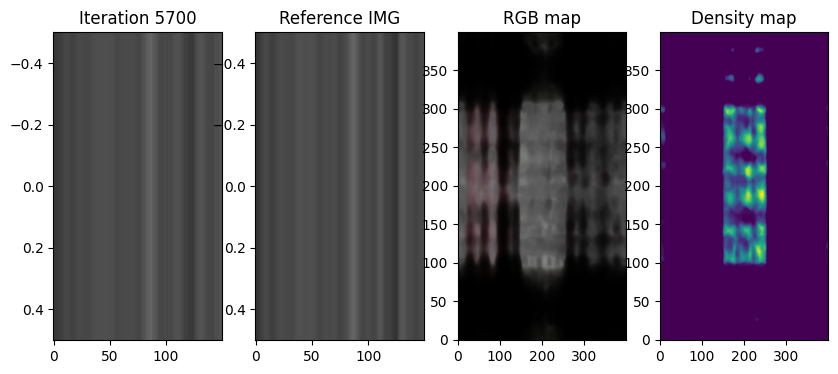

Loss: 0.00027356407372280955


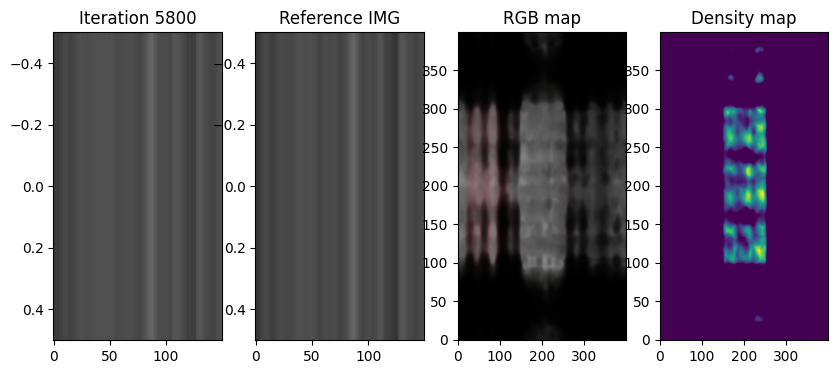

Loss: 0.0001521517406217754


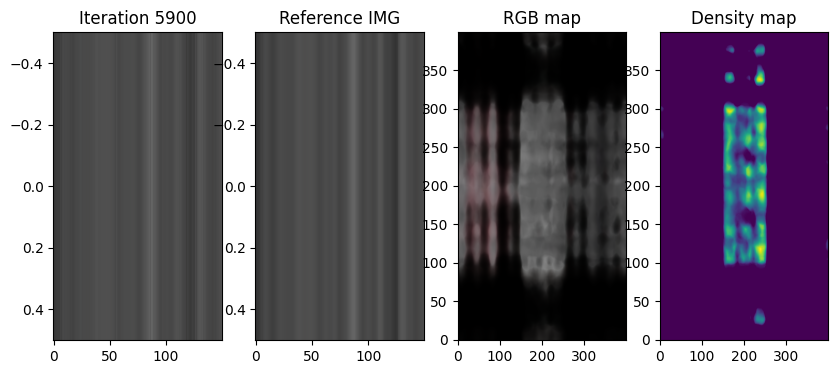

Loss: 0.0001401300251018256


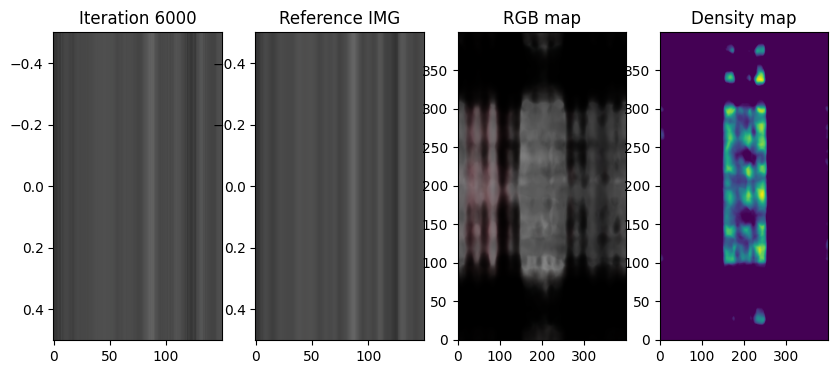

Loss: 0.0003684048424474895


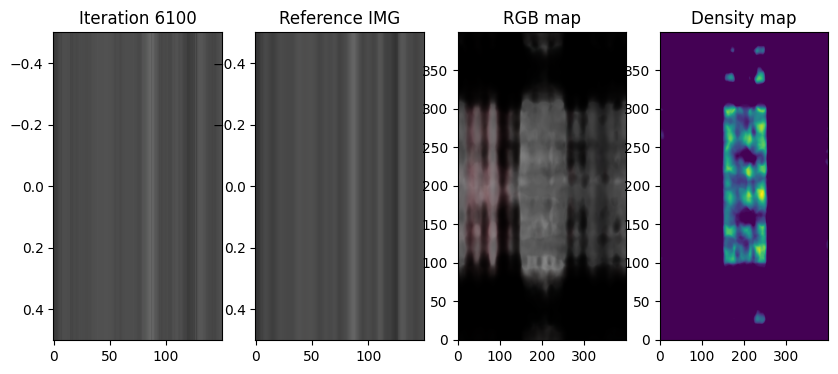

Loss: 0.00020840551587752998


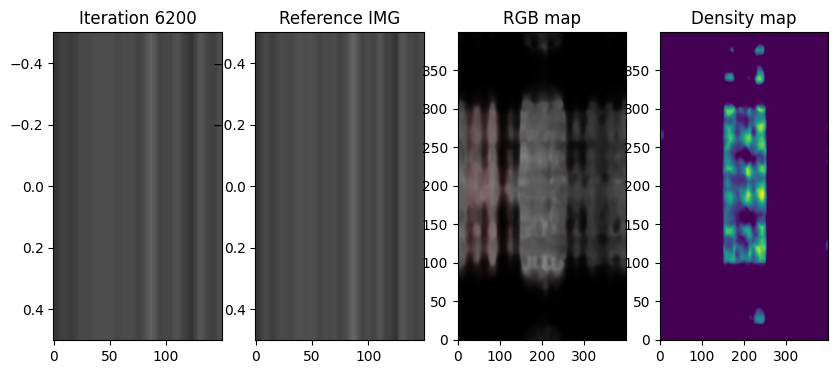

Loss: 0.00015456804248970002


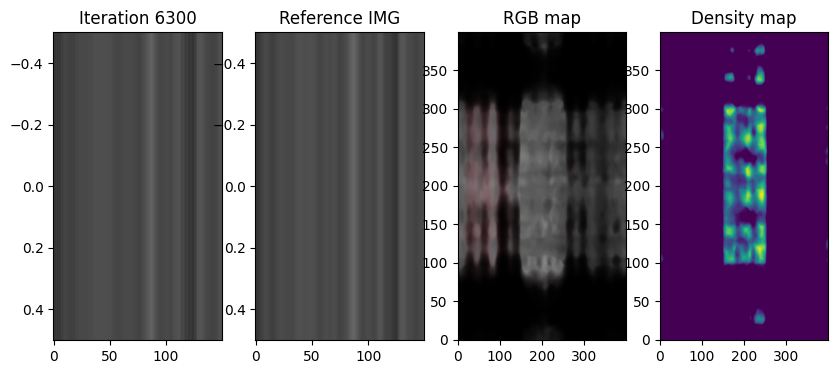

Loss: 0.00028406092314980924


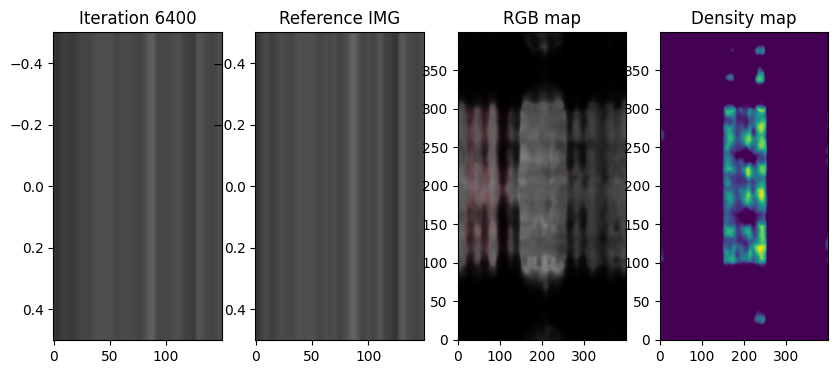

Loss: 0.00014602646115235984


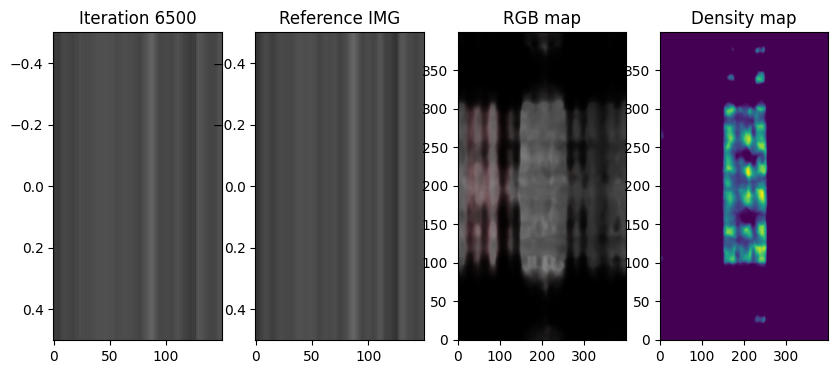

Loss: 0.00017161939467769116


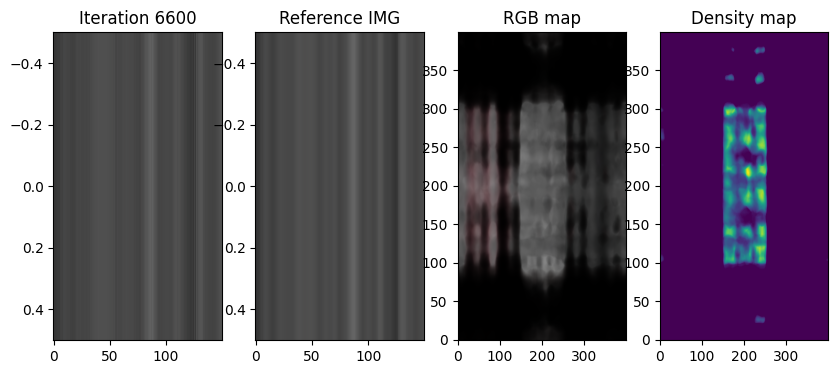

Loss: 0.0007216352969408035


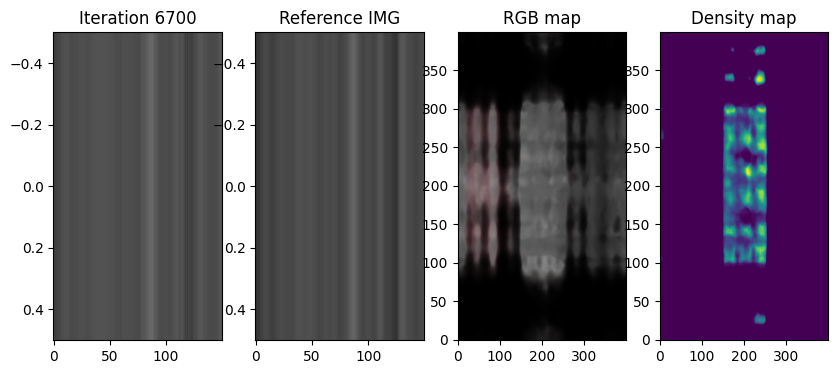

Loss: 0.00012217953917570412


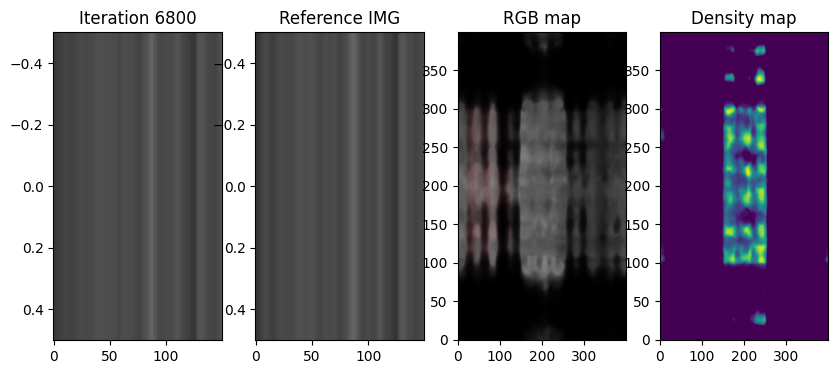

Loss: 0.00012414426601026207


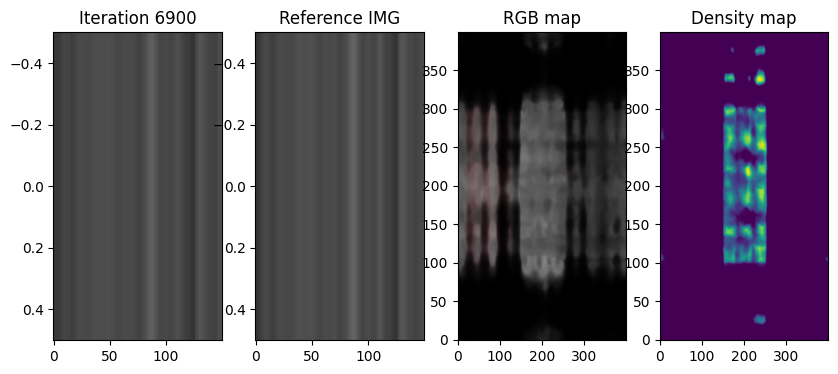

Loss: 0.00025269680190831423


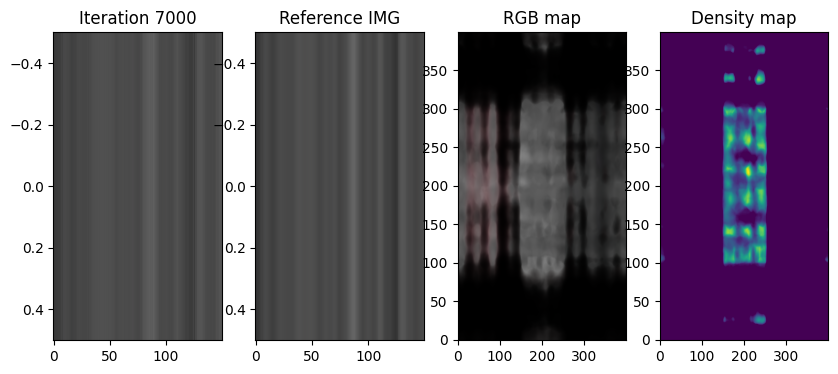

Loss: 0.0001953464379766956


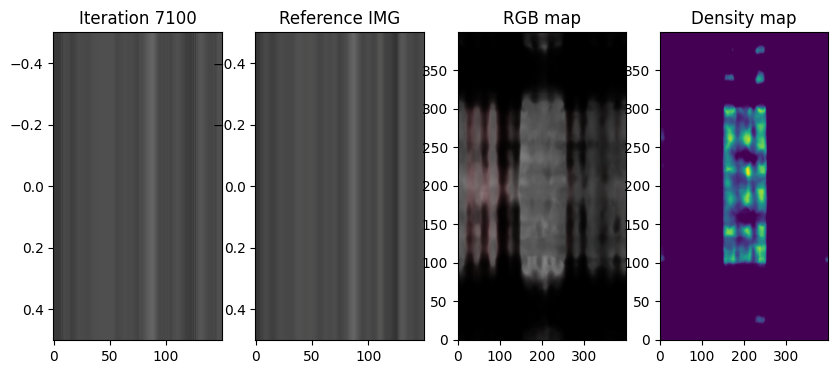

Loss: 0.0001754396507749334


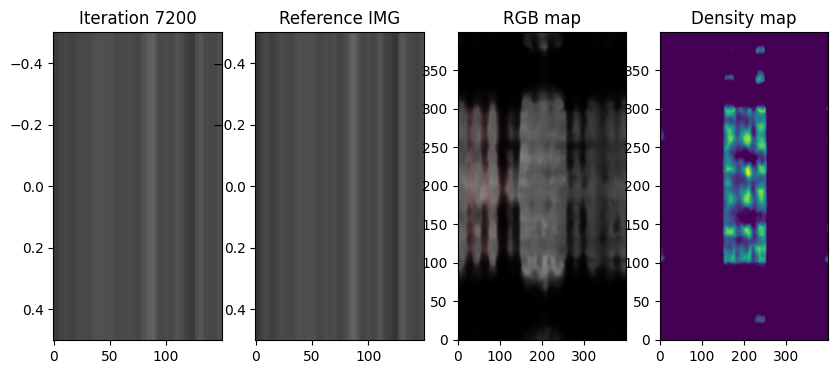

Loss: 0.00012233259622007608


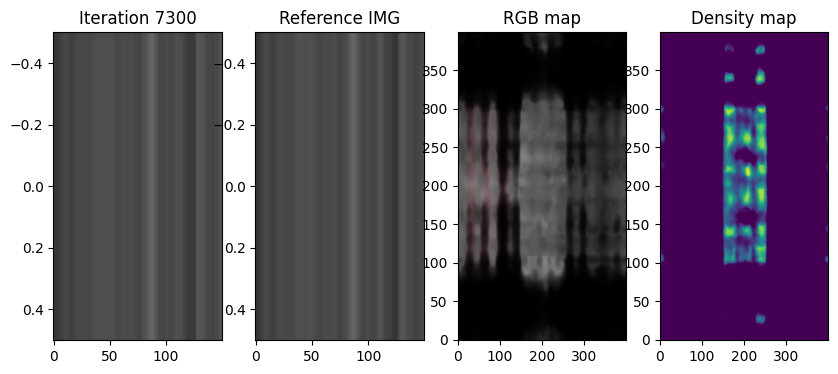

Loss: 0.00016351310478057712


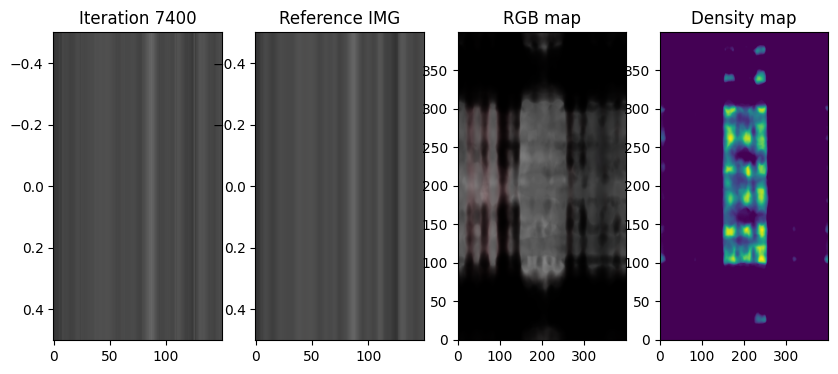

Loss: 0.0004669674963224679


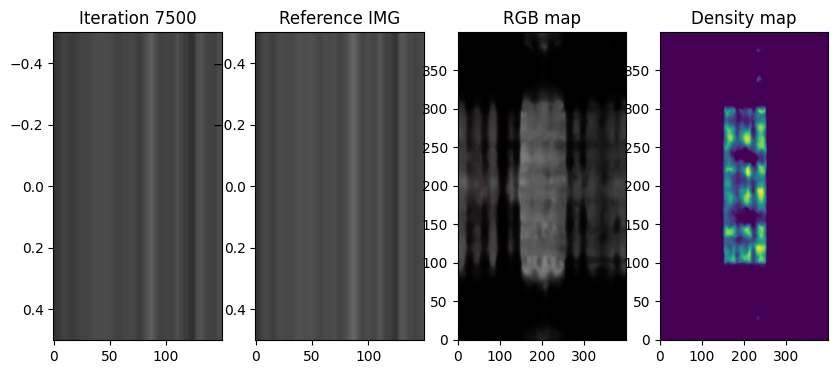

Loss: 0.00013685862359125167


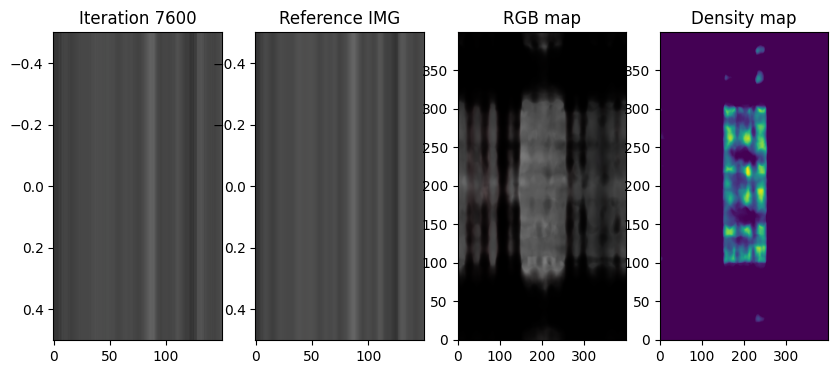

Loss: 0.00017634645337238908


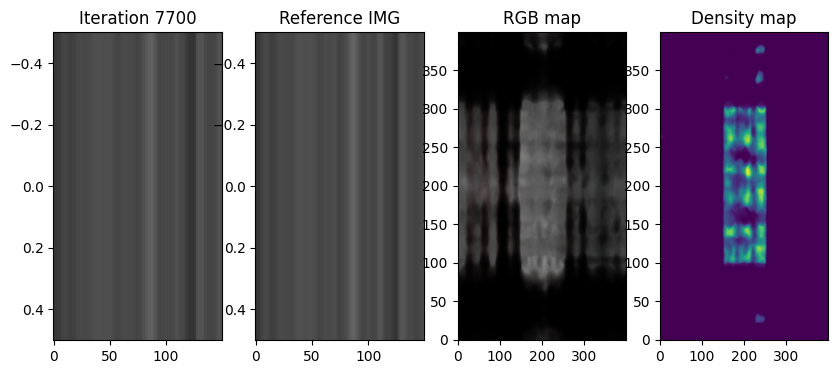

Loss: 0.00016927278193179518


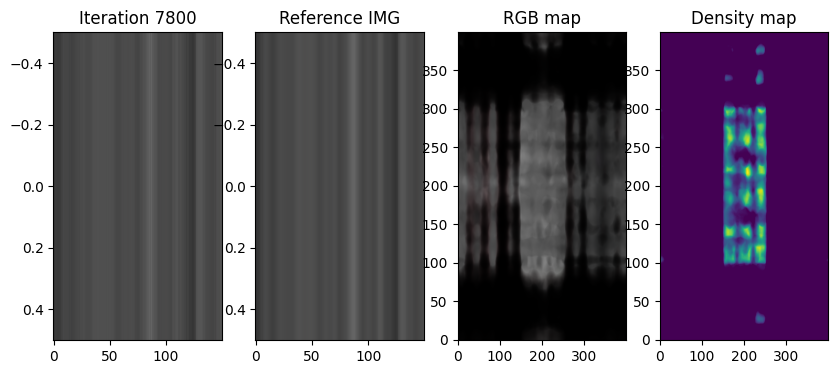

Loss: 0.0001163330816780217


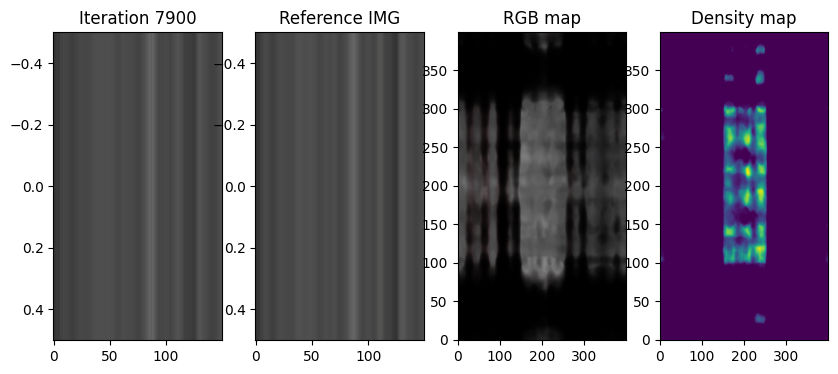

Loss: 0.00014223894686438143


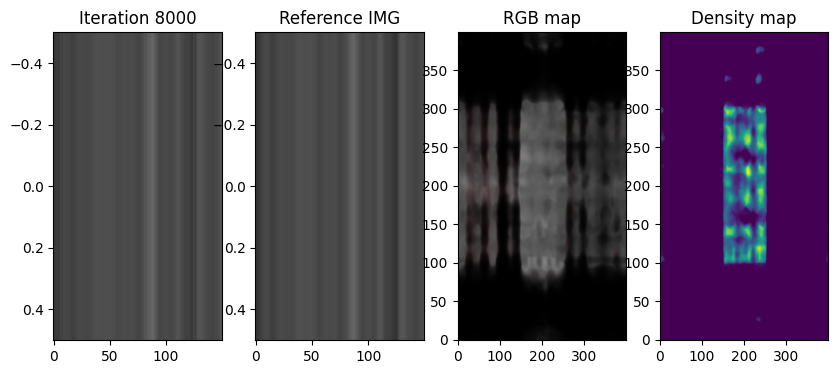

Loss: 0.00012341720866970718


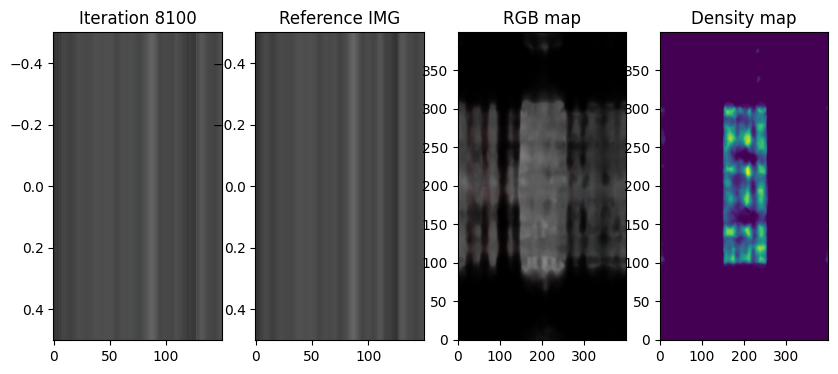

Loss: 0.00015407985483761877


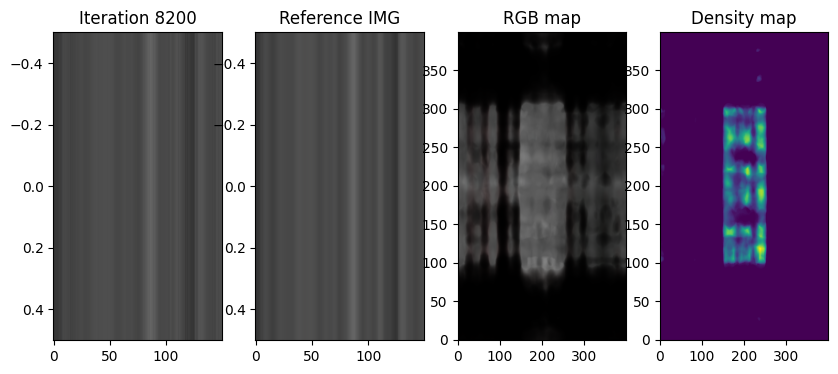

Loss: 0.00012129162496421486


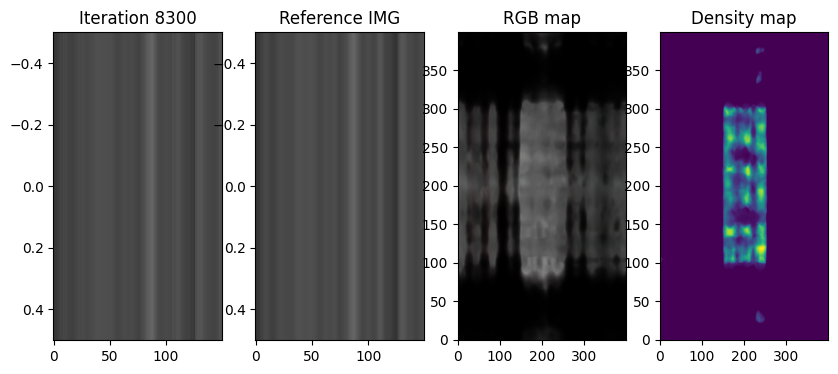

Loss: 0.00014657182327937335


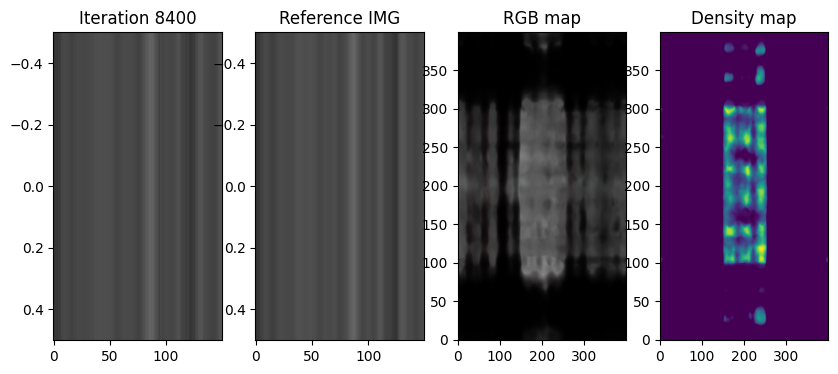

Loss: 0.00011812120646936819


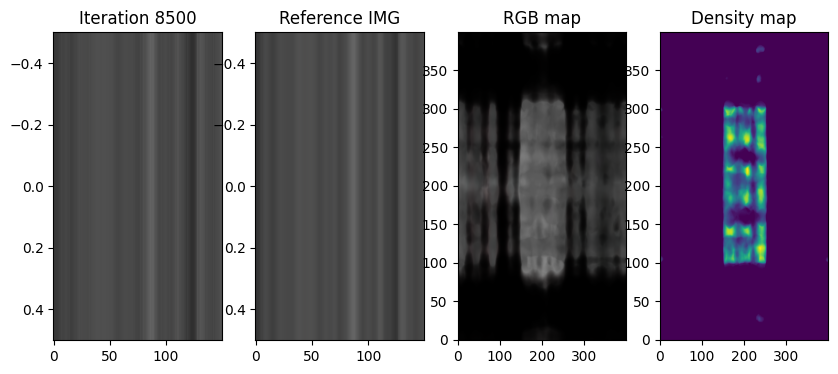

Loss: 0.0001666164753260091


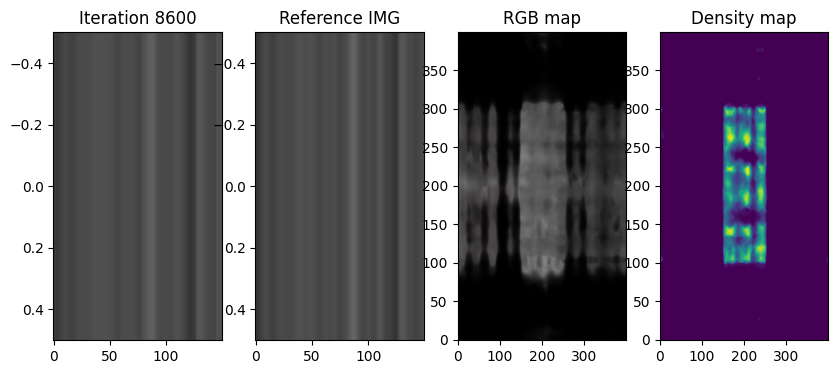

Loss: 0.000278872117633


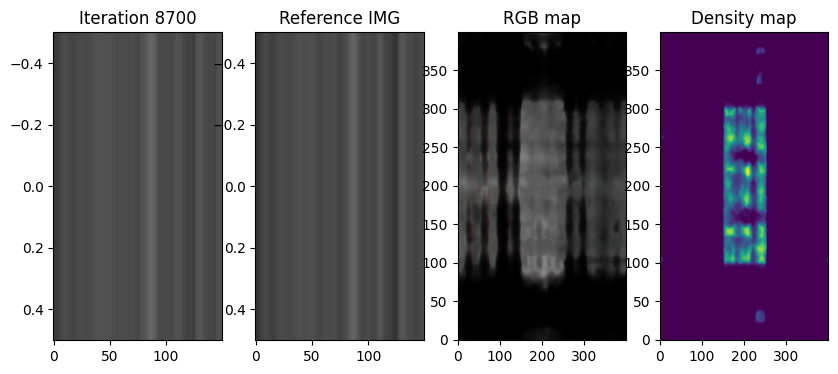

Loss: 0.00014711804396938533


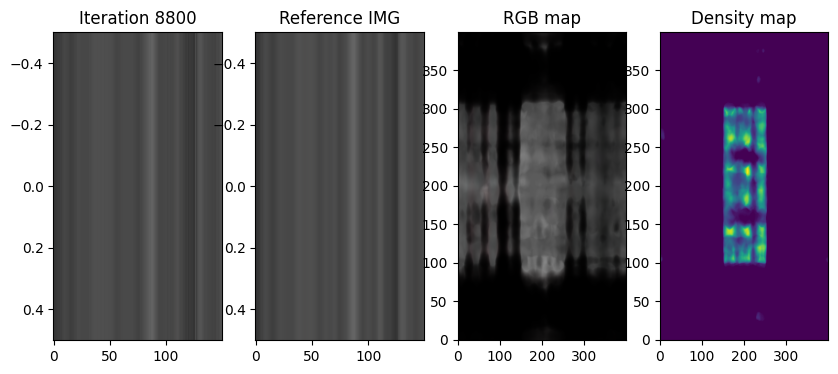

Loss: 0.00016752460214775056


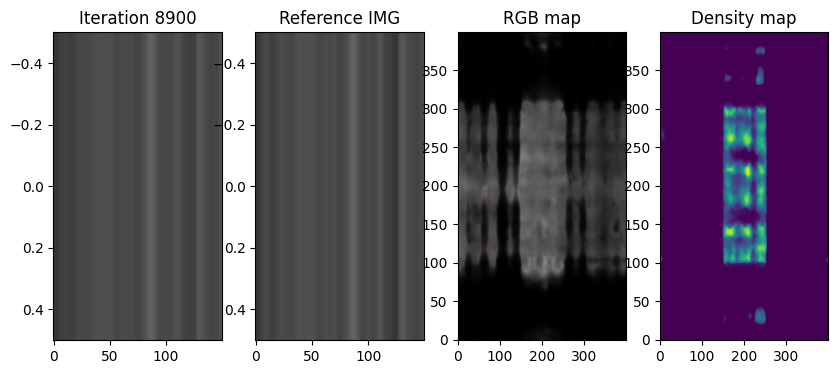

Loss: 0.0001405298535246402


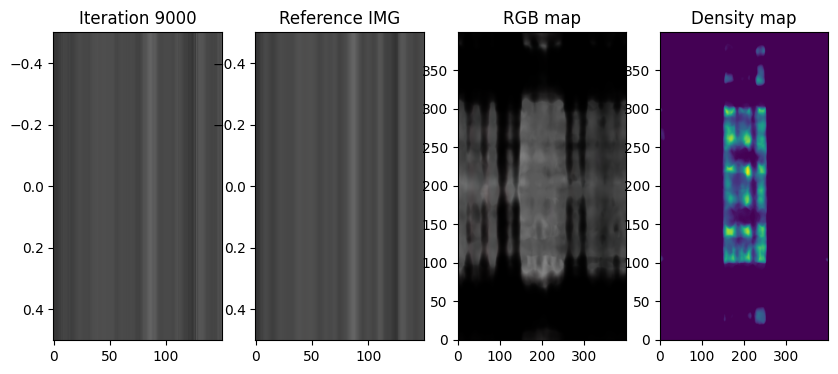

Loss: 0.00012806436279788613


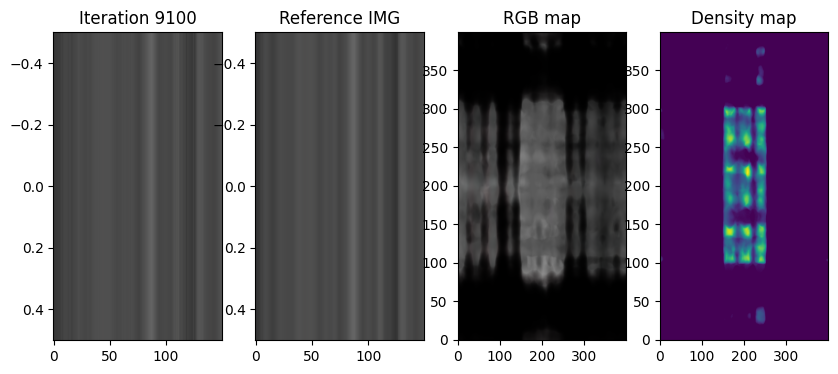

Loss: 0.00011200748849660158


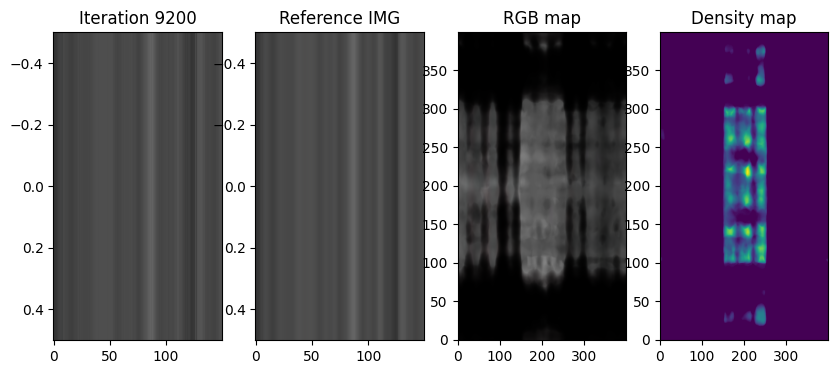

Loss: 0.0003313481865916401


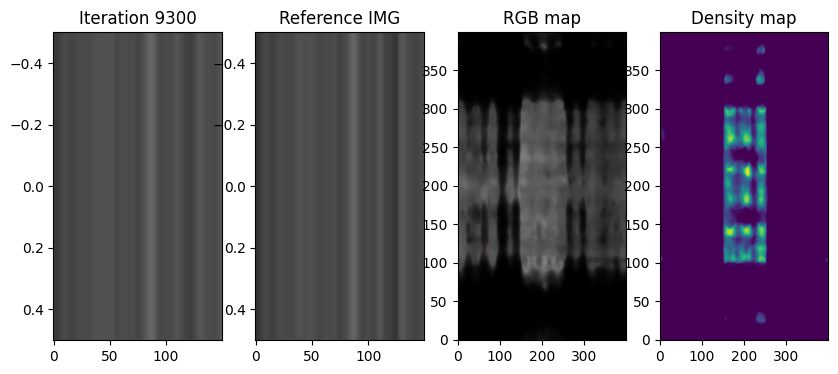

Loss: 0.00019952016009483486


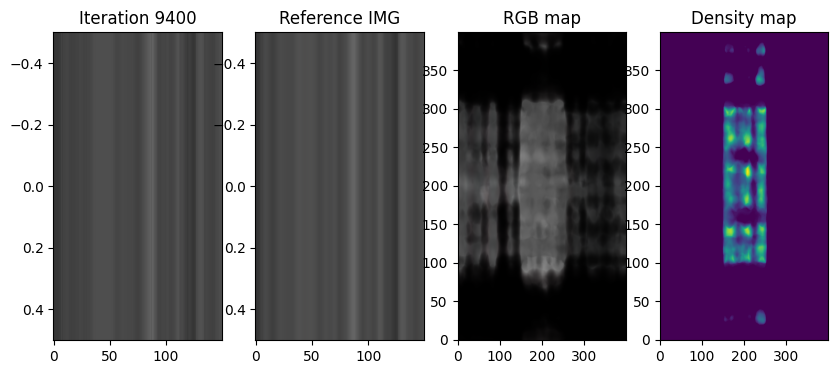

Loss: 0.00013739251880906522


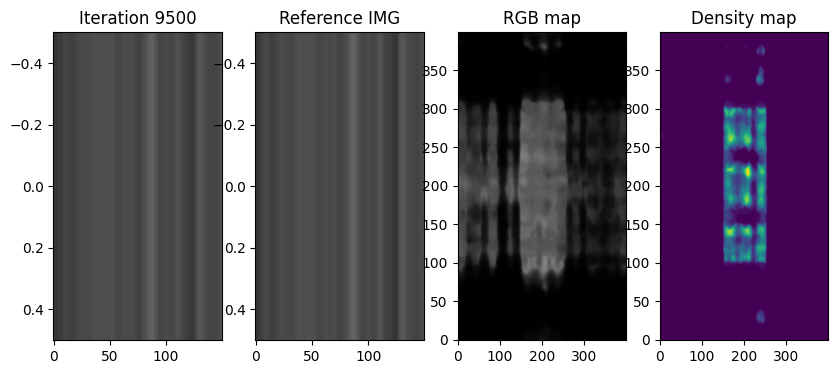

Loss: 0.0002007715665968135


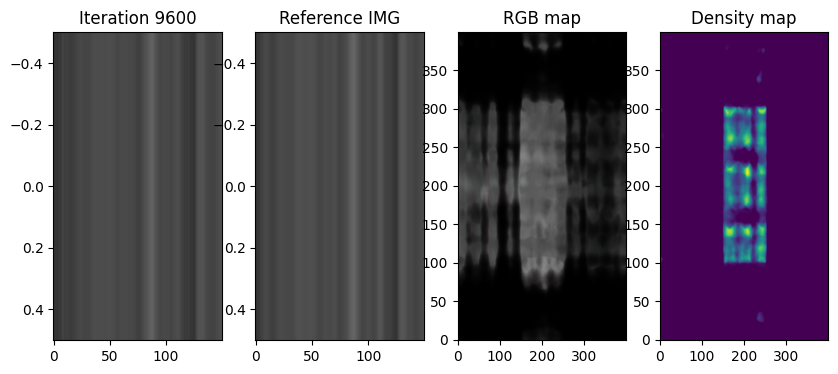

Loss: 0.0002032570046139881


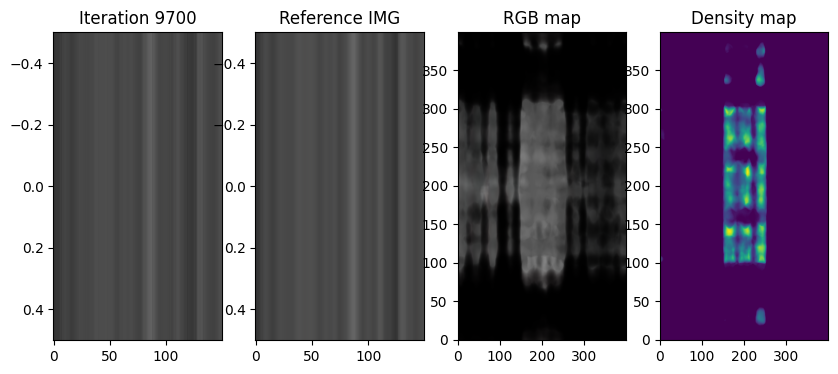

Loss: 0.00014251744141802192


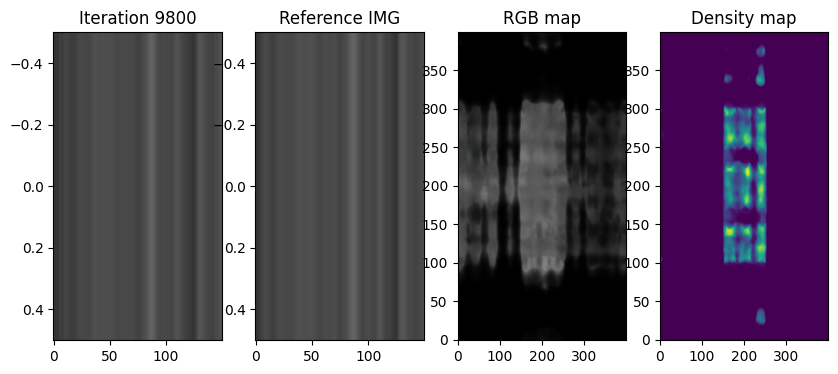

Loss: 0.0001291754306294024


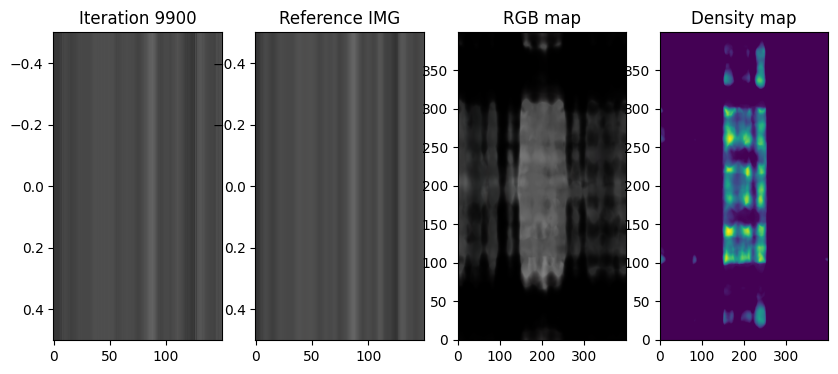

Done!


In [214]:
"""
Parameters for TinyNeRF training (2D)
"""

torch.autograd.set_detect_anomaly(True)

DEBUG_RENDERING = False

img_size = images[0].shape[0]
near_thresh = 30
far_thresh = 200
world_size = scene.shape[0]

# Number of depth samples along each ray.
depth_samples_per_ray = 32

# Chunksize (Note: this isn't batch size in the conventional sense. This only
# specifies the number of rays to be queried in one go. Backprop still happens
# only after all rays from the current "bundle" are queried and rendered).
chunksize = 16384  # Adjust chunksize based on your GPU memory.

# Optimizer parameters
lr = 5e-3
num_iters = 10000

# Misc parameters
display_every = 100  # Number of iters after which stats are displayed

"""
Model
"""

model = VeryTinyNerfModel2D()
model.to(device)

"""
Optimizer
"""
optimizer = torch.optim.Adam(model.parameters(), lr=lr)

"""
Train-Eval-Repeat!
"""

# Seed RNG, for repeatability
seed = 42
torch.manual_seed(seed)
np.random.seed(seed)

# Lists to log metrics etc.
losses = []

for i in range(num_iters):

    # Randomly pick an image as the target.
    target_img_idx = np.random.randint(images.shape[0])
    target_img = images[target_img_idx].to(device)
    target_tform_cam2world = tform_cam2worlds[target_img_idx].to(device)

    # Run one iteration of TinyNeRF and get the rendered RGB image.
    rgb_predicted = run_one_iter_of_tinynerf_2d(world_size, img_size, picture_fov, focal_length,
                                                target_tform_cam2world, near_thresh,
                                                far_thresh, depth_samples_per_ray,
                                                get_minibatches, model, chunksize, DEBUG_RENDERING)

    # Compute mean-squared error between the predicted and target images. Backprop!
    loss = torch.nn.functional.mse_loss(rgb_predicted, target_img)
    losses.append(loss.item())
    loss.backward()
    optimizer.step()
    optimizer.zero_grad()

    # Display images/plots/stats
    if i % display_every == 0:
        # Render the held-out view
        with torch.no_grad():
            rgb_predicted = run_one_iter_of_tinynerf_2d(world_size, img_size, picture_fov, focal_length,
                                                        testpose, near_thresh,
                                                        far_thresh, depth_samples_per_ray,
                                                        get_minibatches, model, chunksize, DEBUG_RENDERING)
            loss = torch.nn.functional.mse_loss(rgb_predicted, testimg)

            # Sample the density across all world points
            # Generate 2d coordinates for the scene
            x = torch.linspace(0, world_size - 1, world_size)
            y = torch.linspace(0, world_size - 1, world_size)
            x, y = torch.meshgrid(x, y)
            flattened_scene_points = torch.stack([x.flatten(), y.flatten()], dim=-1).to(device)
            flattened_scene_points = (flattened_scene_points / world_size) * 2.0 - 1.0
            encoded_scene_points = positional_encoding(flattened_scene_points)
            radiance_field_scene = model(encoded_scene_points)
            sigma = torch.nn.functional.relu(radiance_field_scene[..., 3])
            rgb = torch.sigmoid(radiance_field_scene[..., :3])
            

            print("Loss:", loss.item())
            plt.figure(figsize=(10, 4))
            plt.subplot(141)
            plt.imshow(rgb_predicted.detach().cpu().numpy().reshape(1, -1, 3), aspect="auto")
            plt.title(f"Iteration {i}")
            plt.subplot(142)
            plt.imshow(testimg.detach().cpu().numpy().reshape(1, -1, 3), aspect="auto")
            plt.title("Reference IMG")
            plt.subplot(143)
            plt.imshow(np.transpose(rgb.detach().cpu().numpy().reshape(world_size, world_size, 3), (1, 0 ,2)), aspect="auto", origin="lower")
            plt.title("RGB map")
            plt.subplot(144)
            plt.imshow(np.transpose(sigma.detach().cpu().numpy().reshape(world_size, world_size)), aspect="auto", origin="lower")
            plt.title("Density map")
            plt.show()

print('Done!')

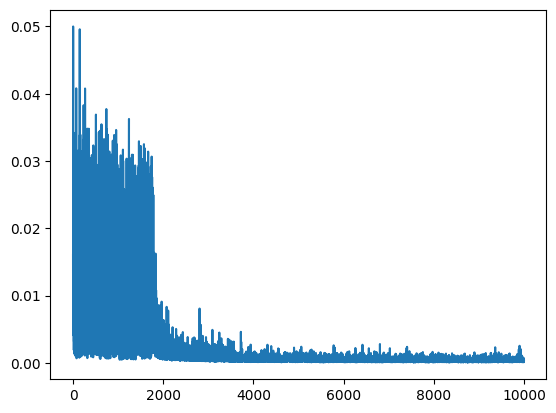

In [217]:
plt.plot(losses)

## Debug

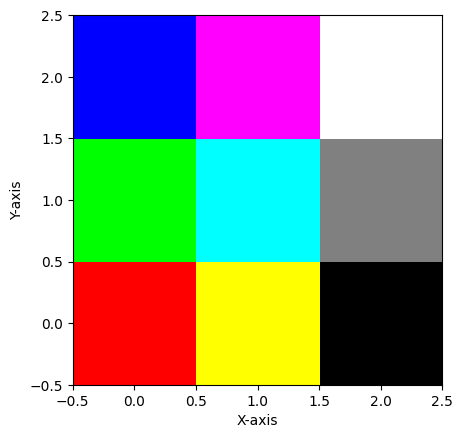

In [220]:
# How to plot an image when stored in a matrix and interpreting it as matrix[i, j] = f(i,j)
# i should be the horizontal coordinate in the image
# j should be the vertical coordinate in the image
# The (0,0) should be the bottom left corner of the image

# Create a sample matrix with RGB values
# Each element is an (R, G, B) tuple
matrix = np.array([[[255, 0, 0], [0, 255, 0], [0, 0, 255]],   # Red, Green, Blue
                   [[255, 255, 0], [0, 255, 255], [255, 0, 255]], # Yellow, Cyan, Magenta
                   [[0, 0, 0], [128, 128, 128], [255, 255, 255]]]) # Black, Gray, White

# Plot the matrix as an image
plt.imshow(np.transpose(matrix, (1,0,2)), origin='lower')

# Add labels
plt.xlabel('X-axis')
plt.ylabel('Y-axis')

# Show the plot
plt.show()

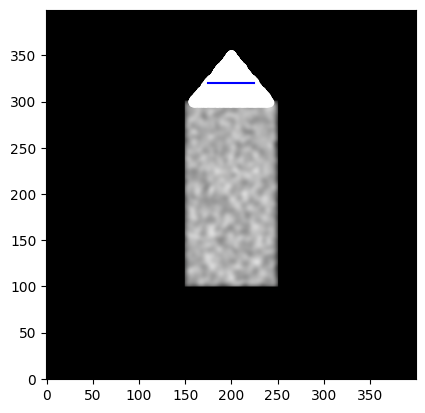

In [221]:
# Define the camera parameters
focal_length = 30  # Example focal length
picture_fov = 50  # Size of the focal plane (in world units)
picture_size = 150  # Number of pixels in the 1D picture

# Take a 1D photo of the scene
viewpoint = (200, 350)  # Example camera center
picture, image_plane_points_x, image_plane_points_y, tform_cam2world = take_1d_picture(scene, center, viewpoint, focal_length, picture_size, picture_fov, debug=True)

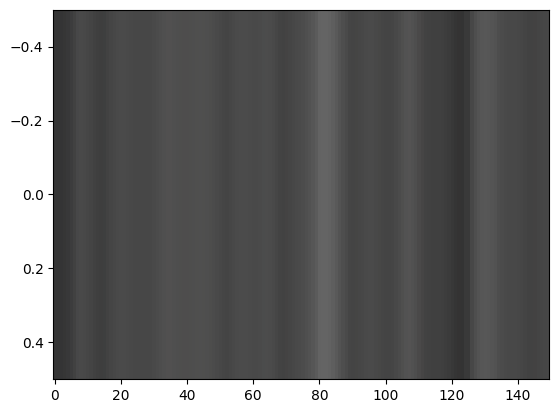

In [222]:
plt.imshow(debug_images[0].reshape(1, -1, 3), aspect='auto')

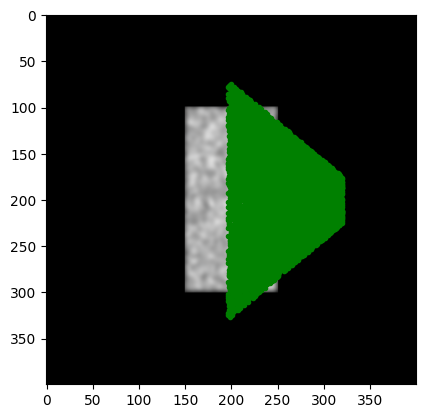

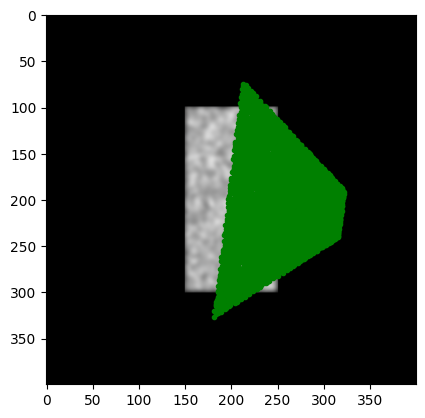

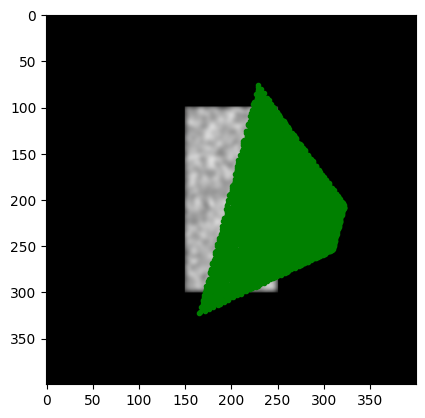

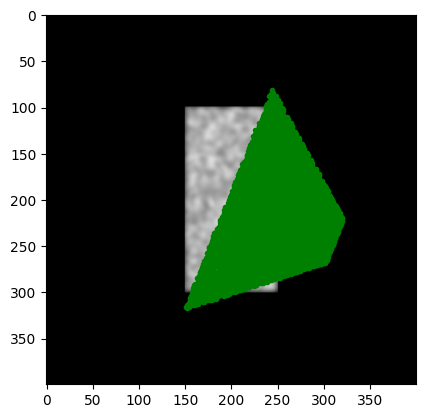

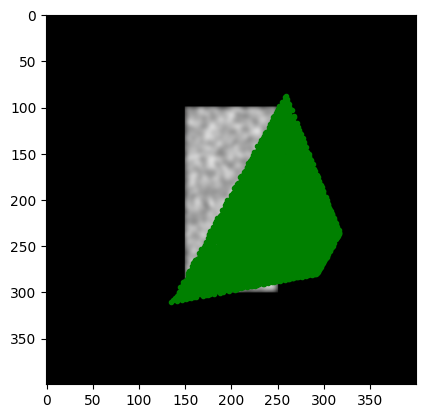

...

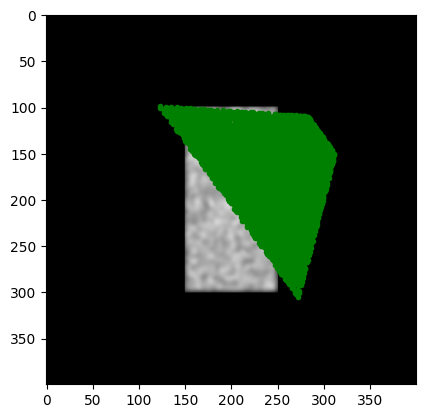

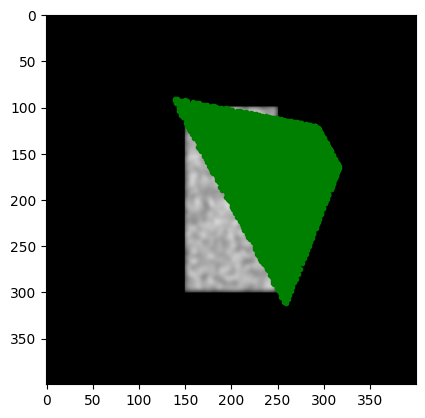

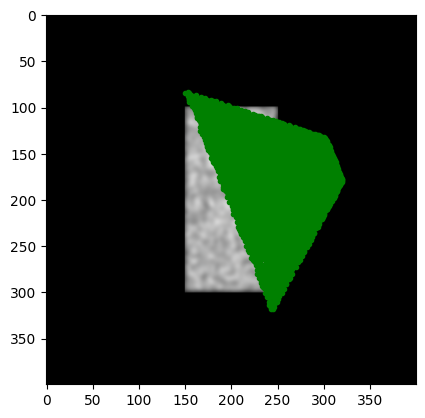

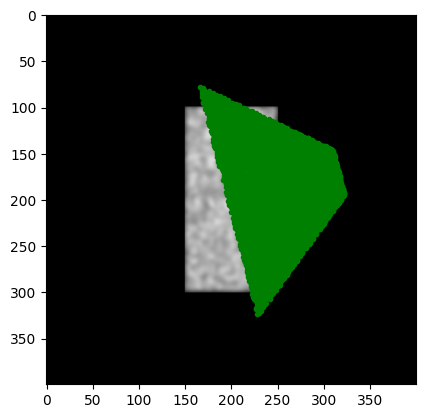

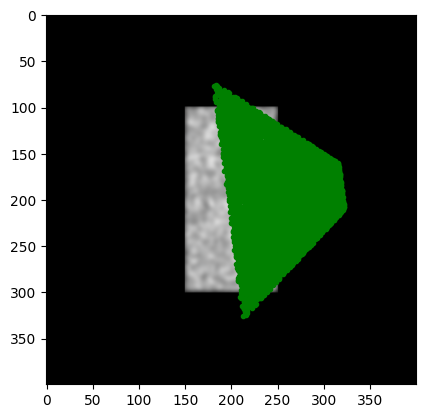

In [223]:
# Draw a circle around the rectangle and take "pictures" from each point
radius = 150
theta = np.linspace(0, 2 * np.pi - (2* np.pi / 50), 50)
viewpoints_x = 200 + radius * np.cos(theta)
viewpoints_y = 200 + radius * np.sin(theta)
debug_images = []
debug_tform_cam2worlds = []
center = (200, 200)

for i in range(viewpoints_x.shape[0]):
    v_x = viewpoints_x[i]
    v_y = viewpoints_y[i]

    debug_image, x, y, debug_tform_cam2world = take_1d_picture(scene, center, (v_x, v_y), focal_length, picture_size, picture_fov)
    debug_images.append(debug_image)
    debug_tform_cam2worlds.append(debug_tform_cam2world)
    plt.figure(i)
    plt.imshow(scene)
    debug_tform_cam2world = torch.tensor(debug_tform_cam2world).to(device)

    ray_origins, ray_directions = get_ray_bundle_2d(img_size, picture_fov, focal_length, debug_tform_cam2world)
    # plt.plot(ray_origins[:, 0], ray_origins[:, 1], 'ro')
    # # Plot ray directions as vectors
    # for j in range(ray_directions.shape[0]):
    #     plt.arrow(ray_origins[j, 0], ray_origins[j, 1], ray_directions[j, 0], ray_directions[j, 1], head_width=1, head_length=100, fc='red', ec='red')

    # Sample query points along each ray
    debug_near_thresh = 30
    debug_far_thresh = 150
    debug_depth_samples_per_ray = 32

    query_points, depth_values = compute_query_points_from_rays_2d(
        ray_origins, ray_directions, debug_near_thresh, debug_far_thresh, debug_depth_samples_per_ray
    )


    plt.plot(x, y, "b-")
    for i in range(query_points.shape[0]):
        plt.plot(query_points[i, :, 0].tolist(), query_points[i, :, 1].tolist(), "g.")
    plt.show()

In [224]:
radiance_field = torch.zeros((query_points.shape[0], query_points.shape[1], 4)).to(device)
for i in range(query_points.shape[0]):
    for j in range(query_points.shape[1]):
        x,y = int(query_points[i, j, 0]), int(query_points[i, j, 1])
        if np.sum(scene[y, x]) != 0:
            radiance_field[i,j,:3] = torch.tensor(scene[y, x])
            radiance_field[i,j,3] = 1
        else:
            radiance_field[i,j,:3] = torch.tensor([0, 0, 0])
            radiance_field[i,j,3] = 0
# Perform differentiable volume rendering to re-synthesize the RGB image.
rgb_predicted, _, _ = render_volume_density_2d(radiance_field, ray_origins, depth_values, no_activation=True)

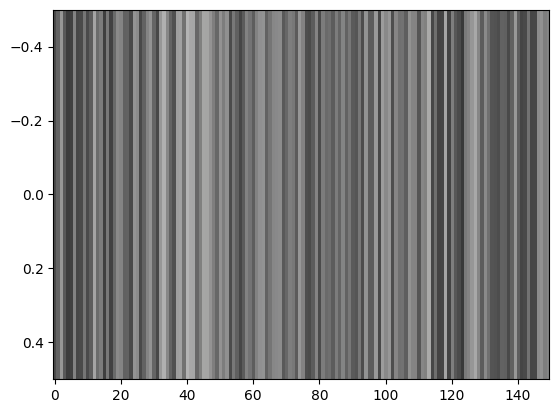

In [225]:
plt.imshow(rgb_predicted.detach().cpu().numpy().reshape(1, -1, 3), aspect="auto")

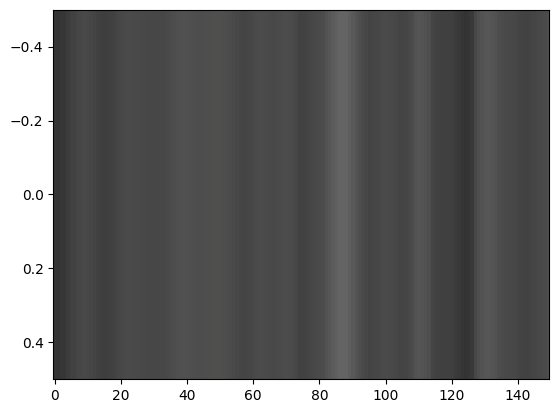

In [226]:
plt.imshow(debug_images[-1].reshape(1, -1, 3), aspect="auto")